In [ ]:
1.	I think you can use VIF<10 as a threshold. I don’t think you should include the variable in the regression if the VIF is too large, that means the model is not stable and cannot really be useful. When the museum variable is significant, I don’t see any VIF issues though.
2.	Low R2 means you capture very limited variance in the dependent variable. You can still say something about the independent variables if they are significant, but people will certainly criticize the limited R2. 
3.	Yes I think you should check Global moran’s I for residuals. Limited papers did it because most of them did not consider the spatial autocorrelation!!
4.	In terms of figures, you need to make sure you use figures carefully and deliver the most information. Do you really need 12 models in your results? What’s the difference between them? Treat yourself as a dissertation reader and consider about it. 


In [16]:
# Считать VIF заранее и убирать переменные 
# убрать те переменные которые ты не проверяешь
# добавить сезон
# добавить квартиль вокеров в москве вмодель
чтобы избавиться от влияния офисов
#визуализировать остатки
# посчитать global Moran

In [ ]:
# Посмотреть открылось ли что-то на ВДНХ за имеющийся период. музей на реставрации - какая категория территории?

In [ ]:
#попробовать разные метрики для rich, абсолютное значение, относительно москвы, относительно района. Посчитать в проценте сколько добавляет

In [1]:
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats
from pysal.model import mgwr

from pysal.explore.esda.moran  import Moran
#
from libpysal.weights import Queen, Rook, KNN

import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor

import osmnx as ox
from shapely.geometry import Point
import geopandas as gpd
import overpy
from shapely.geometry import shape
from shapely.geometry import Polygon
import folium
from folium import Choropleth, Circle, Marker, CircleMarker
from folium.plugins import HeatMap, MarkerCluster

import osmnx as ox

import networkx as nx
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.cm as cm

%matplotlib inline
import matplotlib.colors as mcolors
import warnings
warnings.simplefilter("ignore")
from sklearn.linear_model import LinearRegression as LR
import contextily as ctx

import mplleaflet

from sklearn.metrics import r2_score

import h3

import shapely.wkt

from sklearn.preprocessing import StandardScaler

C:\Users\Intra24\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
C:\Users\Intra24\Anaconda3\lib\site-packages\pysal\explore\segregation\network\network.py:16: UserWarning: You need pandana and urbanaccess to work with segregation's network module
You can install them with  `pip install urbanaccess pandana` or `conda install -c udst pandana urbanaccess`
  "You need pandana and urbanaccess to work with segregation's network module\n"
C:\Users\Intra24\Anaconda3\lib\site-packages\pysal\model\spvcm\abstracts.py:10: UserWarning: The `dill` module is required to use the sqlite backend fully.
  from .sqlite import head_to_sql, start_sql


In [2]:
def get_hex_buffer(df):
    df['hex_buffer']=df['HEX GID'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, True)))

In [2]:
df_loco_analyse=gpd.read_file('df_loco_analyse.csv')

KeyboardInterrupt: 

In [ ]:
df_loco_analyse=df_loco_analyse[~df_loco_analyse['Month'].isin(['2020_04','2019_11','2019_12'])]

In [ ]:
df_loco_analyse['Residents_moscow']=(df_loco_analyse['Residents'].astype(float)/df_loco_analyse['Residents/moscow'].astype(float)).apply(lambda x: 0 if pd.isnull(x) else x)    

In [ ]:
df_loco_analyse['Non-residents']=df_loco_analyse['Non-residents'].astype(float)


In [ ]:
df_loco_analyse['Non-residents/moscow']=(df_loco_analyse['Non-residents']/df_loco_analyse['Residents_moscow']).apply(lambda x: 0 if np.inf==x or pd.isnull(x) else x)

In [17]:
for i in ['intersect','links','link_node ratio','connected_node_ratio','fin_ws']:
    df_loco_analyse[i]=df_loco_analyse[i].astype(float)

In [18]:
df_loco_analyse['season']=[j if i !='2020_07' else 'corona' for i,j in zip(df_loco_analyse['Month'], df_loco_analyse ['season'])]

In [19]:
df_loco_analyse['geometry_hex']=df_loco_analyse['geometry_hex'].apply(lambda x: shapely.wkt.loads(x))
df_loco_analyse.set_geometry('geometry_hex', inplace=True)

In [18]:
df_loco_analyse.set_crs('epsg:3857', inplace=True)

,HEX GID,geometry_hex,Month,Active youth interest 2.4,Families interest 2.4,Fast food interest 2.4,Hardworkers interest 2.4,Healthy lifestile interest 2.4,Non-residents,Residents,...,hex_buffer1000,intersect,links,link_node ratio,connected_node_ratio,fin_ws,season,is_living,geometry,Residents_moscow
0,891181b4183ffff,POINT (4197966.873 7476425.352),2019_01,8.283031820787054,10.37415916994145,11.562546248785242,10.341484973977426,5.495151479818187,17.0,0.0,...,"POLYGON ((4198966.872617397 7476425.352244114,...",9.0,18.0,2.000000,0.75,4.887019,0,1,None,0.0
1,891181b4183ffff,POINT (4197966.873 7476425.352),2019_02,9.028182035050657,9.825902610629072,10.796831639472392,9.336216980162167,5.901323304802551,21.0,0.0,...,"POLYGON ((4198966.872617397 7476425.352244114,...",9.0,18.0,2.000000,0.75,4.887019,0,1,None,0.0
2,891181b4183ffff,POINT (4197966.873 7476425.352),2019_03,8.085264499234752,10.056072692725417,10.731061926272183,8.351148049266005,5.697284015136492,48.0,0.0,...,"POLYGON ((4198966.872617397 7476425.352244114,...",9.0,18.0,2.000000,0.75,4.887019,1,1,None,0.0
3,891181b4183ffff,POINT (4197966.873 7476425.352),2019_04,7.515304909096531,9.588933871879652,11.12351202050138,8.094389089177897,5.705817039065955,39.0,0.0,...,"POLYGON ((4198966.872617397 7476425.352244114,...",9.0,18.0,2.000000,0.75,4.887019,1,1,None,0.0
4,891181b4183ffff,POINT (4197966.873 7476425.352),2019_05,8.733340317520161,10.801182734577816,9.224337683446663,9.481237228277617,6.830894140543043,34.0,0.0,...,"POLYGON ((4198966.872617397 7476425.352244114,...",9.0,18.0,2.000000,0.75,4.887019,1,1,None,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165731,8911aa7b6dbffff,POINT (4173018.467 7488218.502),2020_02,7.766976326540835,14.838308332323255,5.769658495647955,6.172012145454137,7.1028361561311675,95.0,5.0,...,"POLYGON ((4174018.46657648 7488218.501669228, ...",564.0,1024.0,1.815603,0.80,78.137500,0,0,None,14972.5
165732,8911aa7b6dbffff,POINT (4173018.467 7488218.502),2020_03,6.356148361562619,15.210017694953404,4.67390956563332,5.2329896239972316,7.084754380372522,239.0,14.0,...,"POLYGON ((4174018.46657648 7488218.501669228, ...",564.0,1024.0,1.815603,0.80,78.137500,1,0,None,31135.0
165734,8911aa7b6dbffff,POINT (4173018.467 7488218.502),2020_05,6.346269421934968,13.80456623866992,5.486276524908986,6.056753292627809,7.225797603618853,50.0,1.0,...,"POLYGON ((4174018.46657648 7488218.501669228, ...",564.0,1024.0,1.815603,0.80,78.137500,corona,0,None,10307.0
165735,8911aa7b6dbffff,POINT (4173018.467 7488218.502),2020_06,7.454252073989602,15.90246543318683,6.172585427865384,6.421816708897167,7.568259247561118,45.0,2.0,...,"POLYGON ((4174018.46657648 7488218.501669228, ...",564.0,1024.0,1.815603,0.80,78.137500,corona,0,None,11654.0


In [123]:
df_season=df_loco_analyse.groupby(['HEX GID','season'])['Non-residents/moscow'].mean().reset_index()

In [125]:
df_season=df_season.merge(df_loco_analyse[df_loco_analyse['Month']=='2019_01'][['geometry_hex','HEX GID']], on='HEX GID')

In [126]:
df_season['geometry_hex']=df_season['geometry_hex'].apply(lambda x: shapely.wkt.loads(x))

In [127]:
df_season=gpd.GeoDataFrame(df_season, crs='epsg:3857', geometry='geometry_hex')

<AxesSubplot:>

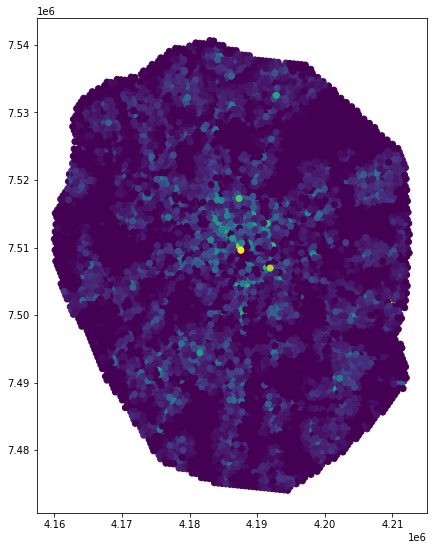

In [131]:
df_season[df_season['season']=='corona'].plot(figsize=(7,12), column='Non-residents/moscow')

In [151]:
df_season['q_nr']=df_season.groupby('season')['Non-residents/moscow'].apply(lambda x: pd.qcut(x, q=4, duplicates='drop', labels=False))

In [16]:
df_model.dtypes

HEX GID                               object
geometry_hex                          object
Month                                float64
Active youth interest 2.4/moscow     float64
Rich men interest 2.4/moscow          object
Non-residents/moscow                  object
season                               float64
intersect                            float64
links                                float64
link_node ratio                      float64
connected_node_ratio                 float64
fin_ws_left                           object
mus_350                              float64
mus_1000                            geometry
rail_350                             float64
metro_350                            float64
bus_350                              float64
is_living                            float64
dtype: object

In [158]:
df_season1=pd.pivot_table(df_season, columns='season', index='HEX GID', values='q_nr', aggfunc='sum')

In [179]:
for i in df_season1.columns:
    l=[]
    for j in df_season1.columns:
        if i!=j:
            l.append((df_season1[i]==df_season1[j]).mean())
    print (i, np.mean(l))

0 0.8401639344262295
1 0.8391894990255646
2 0.8231686346440446
3 0.8166055256219191
corona 0.7784879055370859


In [8]:
df_dist_ws=gpd.read_file('df_dist_ws.geojson')

In [11]:
df_dist_ws.head()

,en_name,fin_ws,geometry
0,Akademicheskij,73.201991,"POLYGON ((37.55226 55.68403, 37.55232 55.68408..."
1,Alekseevskij,68.085393,"POLYGON ((37.63499 55.79714, 37.63552 55.79965..."
2,Altuf'evskij,64.348798,"POLYGON ((37.56740 55.88730, 37.57245 55.88724..."
3,Arbat,86.595697,"POLYGON ((37.57206 55.75202, 37.57396 55.75256..."
4,Aeroport,77.261743,"POLYGON ((37.51101 55.80608, 37.51137 55.80647..."


In [21]:
df_loco_analyse=gpd.sjoin(df_loco_analyse, df_dist_ws.to_crs('epsg:3857'), op='within', how='left')

In [21]:
df_loco_analyse['Residents']=df_loco_analyse['Residents'].astype(float)
df_loco_analyse['Workers']=df_loco_analyse['Workers'].astype(float)
df_loco_analyse.dtypes

HEX GID                                    object
geometry_hex                             geometry
Month                                      object
Active youth interest 2.4                  object
Families interest 2.4                      object
Fast food interest 2.4                     object
Hardworkers interest 2.4                   object
Healthy lifestile interest 2.4             object
Non-residents                             float64
Residents                                 float64
Rich men interest 2.4                      object
Shopping addicted interest 2.4             object
Sport and fitness interest 2.4             object
Travellers interest 2.4                    object
Users                                      object
Visitors                                   object
Women 18-35 interest 2.4                   object
Workers                                   float64
Active youth interest 2.4/moscow           object
Families interest 2.4/moscow               object


In [23]:
df_loco_analyse.columns

Index(['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4',
       'Families interest 2.4', 'Fast food interest 2.4',
       'Hardworkers interest 2.4', 'Healthy lifestile interest 2.4',
       'Non-residents', 'Residents', 'Rich men interest 2.4',
       'Shopping addicted interest 2.4', 'Sport and fitness interest 2.4',
       'Travellers interest 2.4', 'Users', 'Visitors',
       'Women 18-35 interest 2.4', 'Workers',
       'Active youth interest 2.4/moscow', 'Families interest 2.4/moscow',
       'Fast food interest 2.4/moscow', 'Hardworkers interest 2.4/moscow',
       'Healthy lifestile interest 2.4/moscow', 'Non-residents/moscow',
       'Residents/moscow', 'Rich men interest 2.4/moscow',
       'Shopping addicted interest 2.4/moscow', 'Signals/moscow',
       'Sport and fitness interest 2.4/moscow',
       'Travellers interest 2.4/moscow', 'Users/moscow', 'Visitors/moscow',
       'Women 18-35 interest 2.4/moscow', 'Workers/moscow',
       'Workers/Residents', 'hex

In [22]:
for i in ['Rich men interest 2.4','Rich men interest 2.4/moscow','Families interest 2.4', 'Active youth interest 2.4','Active youth interest 2.4/moscow', 'Families interest 2.4/moscow']:
    df_loco_analyse[i]=df_loco_analyse[i].astype(float)

In [25]:
# Residential or workking?

In [27]:
df_loco_analyse1=df_loco_analyse.copy()

In [28]:
df_liv=df_loco_analyse.groupby('HEX GID')['Residents','Workers'].sum()

In [29]:
df_liv=df_liv[(df_liv['Residents']+df_liv['Workers']>0)]

In [30]:
df_liv['is_living']=(df_liv['Residents']/df_liv['Workers']).apply(lambda x: 1 if pd.isnull(x) or x==np.inf else 1*(x>=1))
# 

In [31]:
df_liv=df_liv.join(df_loco_analyse.set_index('HEX GID')['en_name'])
df_liv['is_living']=df_liv.groupby('en_name')['is_living'].transform('median')
df_liv['is_living']=df_liv['is_living'].apply(lambda x: round(x))

In [83]:
df_liv

,Residents,Workers,is_living,en_name
HEX GID,,,,
891181b41a3ffff,0.0,2.0,1,Birjulevo Vostochnoe
891181b41a3ffff,0.0,2.0,1,Birjulevo Vostochnoe
891181b41a3ffff,0.0,2.0,1,Birjulevo Vostochnoe
891181b41a3ffff,0.0,2.0,1,Birjulevo Vostochnoe
891181b41a3ffff,0.0,2.0,1,Birjulevo Vostochnoe
...,...,...,...,...
8911aa7b6dbffff,80.0,101.0,1,Teplyj Stan
8911aa7b6dbffff,80.0,101.0,1,Teplyj Stan
8911aa7b6dbffff,80.0,101.0,1,Teplyj Stan


In [33]:
df_loco_analyse=df_loco_analyse.drop('is_living', axis=1).merge(df_liv[['is_living']].reset_index().drop_duplicates(), on='HEX GID').reset_index()

In [ ]:
df_loco_analyse['link']

In [286]:
df_hex_ws=df_loco_analyse.groupby('HEX GID')['intersect','links','link_node','connected_','fin_ws_lef'].mean().reset_index()

df_hex_ws['hex_buffer']=df_hex_ws['HEX GID'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, True)))

df_hex_ws=gpd.GeoDataFrame(df_hex_ws, crs='epsg:4326', geometry='hex_buffer')

In [34]:
# df_loco_analyse['r']=df_loco_analyse.groupby(['HEX GID','Month'])['links'].rank('first')
# df_loco_analyse=df_loco_analyse[df_loco_analyse['r']==1]

In [36]:
df_loco_analyse.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

2019_01


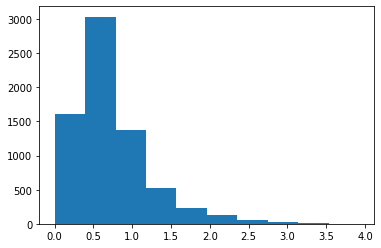

2019_02


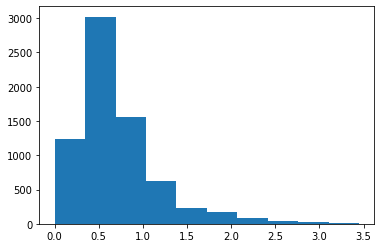

2019_03


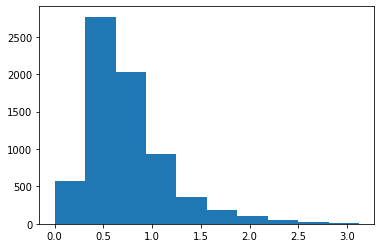

2019_04


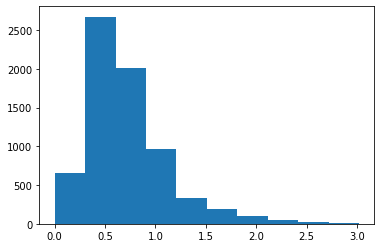

2019_05


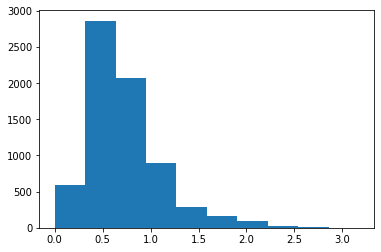

2019_06


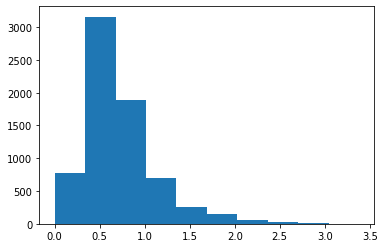

2019_07


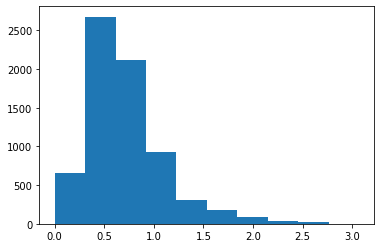

2019_08


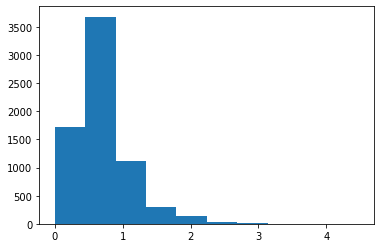

2019_09


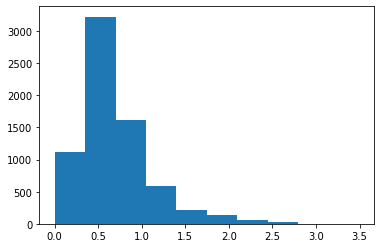

2019_10


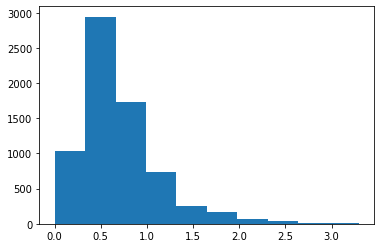

2020_01


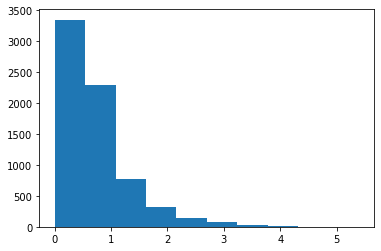

2020_02


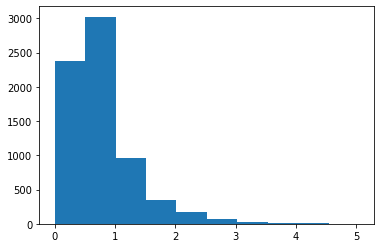

2020_03


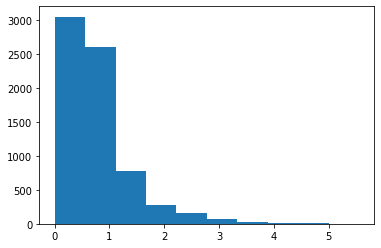

2020_05


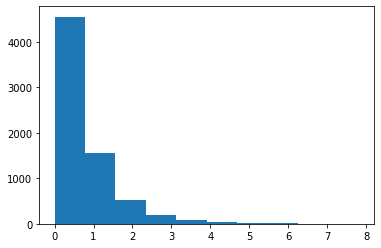

2020_06


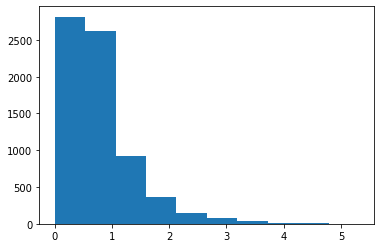

2020_07


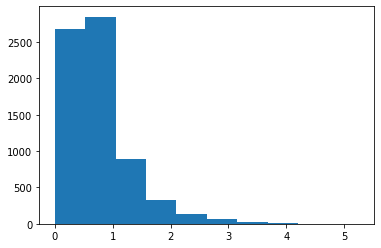

In [118]:
for m in df_model.Month.unique():
    print(m)
    plt.hist(df_model[df_model.Month==m]['Rich men interest 2.4/moscow'])
    plt.show()

In [233]:
df_model['lock']=df_model['Month'].apply(lambda x: 'lockdown' if x in['2020_05','2020_03', '2020_06'] else ( 'recovery' if x=='2020_07' else 'normal' ))

normal


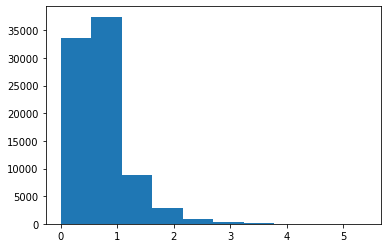

lockdown


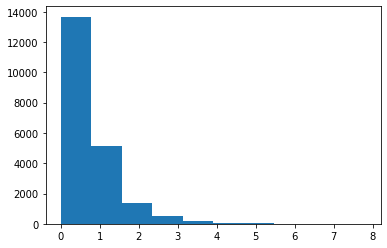

recovery


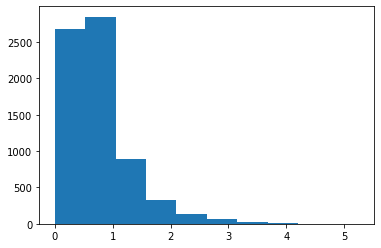

In [123]:
for m in df_model.lock.unique():
    print(m)
    plt.hist(df_model[df_model.lock==m]['Rich men interest 2.4/moscow'])
    plt.show()

normal


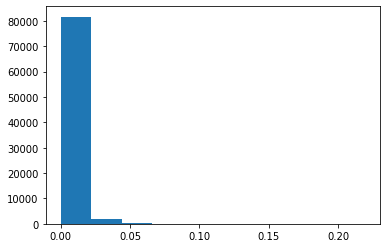

lockdown


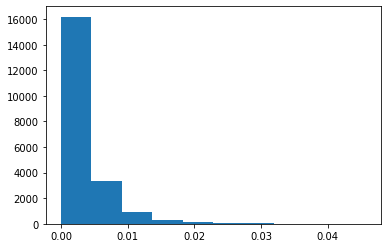

recovery


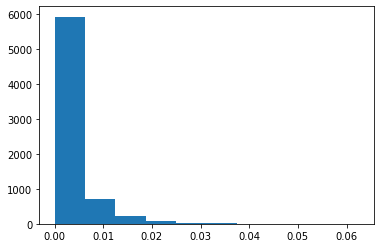

In [159]:
for m in df_model.lock.unique():
    print(m)
    plt.hist(df_model[df_model.lock==m]['Non-residents/moscow'])
    plt.show()

In [160]:
df_one_month['Non-residents/moscow'].sum()

29.784887583481975

In [234]:
df_median=df_model.groupby(['lock','HEX GID'])[['Rich men interest 2.4','Rich men interest 2.4/moscow','Active youth interest 2.4/moscow','Non-residents','Users','Non-residents/moscow']].mean().reset_index()

In [235]:
df_median=df_median.merge(df_one_month[['HEX GID','hex_buffer','land_use']], on='HEX GID')

In [236]:
df_median=gpd.GeoDataFrame(df_median, crs='epsg:4326', geometry='hex_buffer')

In [237]:
vmax_r=df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Non-residents'].max()
vmin_r=df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Non-residents'].min()

lockdown


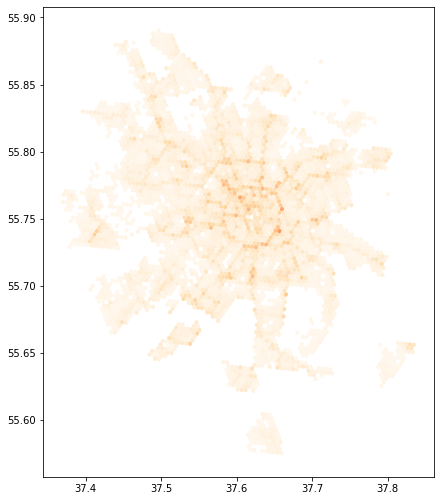

normal


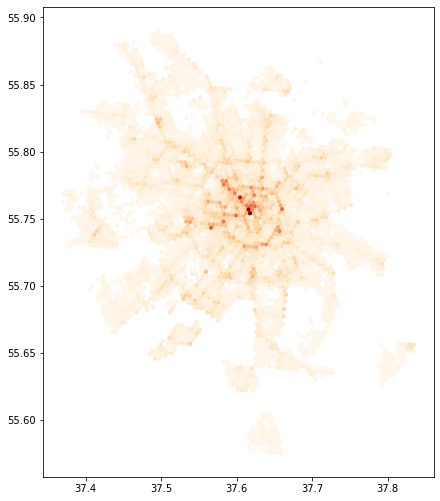

recovery


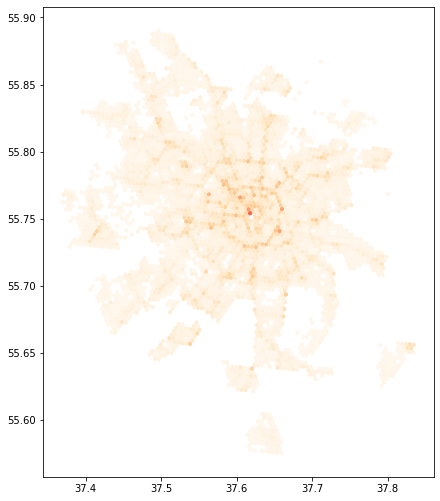

In [238]:
for m in df_median.lock.unique():
    print(m)
    df_median[(df_median.lock==m)&(df_median['land_use']=='commercial')].plot(column='Non-residents', cmap='OrRd', figsize=(7,11), vmin=vmin_r, vmax=vmax_r)
#     plt.clim(vmin_r,vmax_r)
    plt.show()
#     plt.title('Май-июнь 2020')

In [155]:
df_model[(df_model.lock=='lockdown')&(df_model['land_use']=='commercial')]['Rich men interest 2.4/moscow'].max()

7.812593396131844

In [156]:
df_model[(df_model.lock=='lockdown')&(df_model['land_use']=='commercial')]['Rich men interest 2.4'].min()

0.0

In [208]:
vmax_r=df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'].max()
vmin_r=df_median[(df_median.lock=='lockdown')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'].min()

<AxesSubplot:>

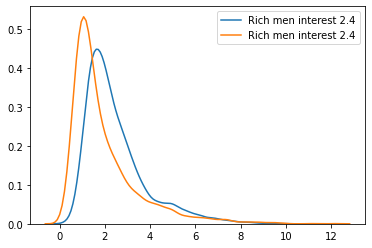

In [216]:
sns.kdeplot(df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'])
sns.kdeplot(df_median[(df_median.lock=='lockdown')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'])

In [218]:
df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'].mean()

2.4734265465458494

In [217]:
df_median[(df_median.lock=='lockdown')&(df_median['land_use']=='commercial')]['Rich men interest 2.4'].mean()

1.9564896870099884

In [219]:
1.9564896870099884/2.4734265465458494

0.791003755394408

In [221]:
df_median[(df_median.lock=='lockdown')&(df_median['land_use']=='commercial')]['Non-residents/moscow'].mean()/df_median[(df_median.lock=='normal')&(df_median['land_use']=='commercial')]['Non-residents/moscow'].mean()

0.6173837874989938

lockdown


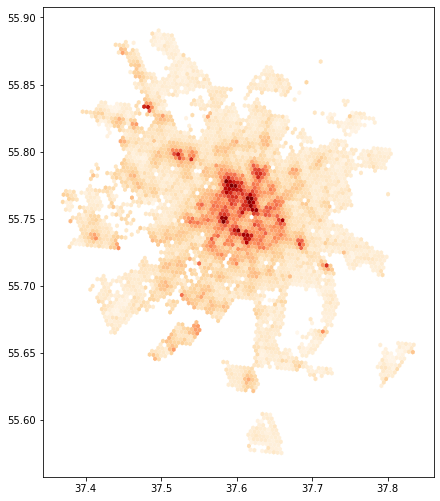

normal


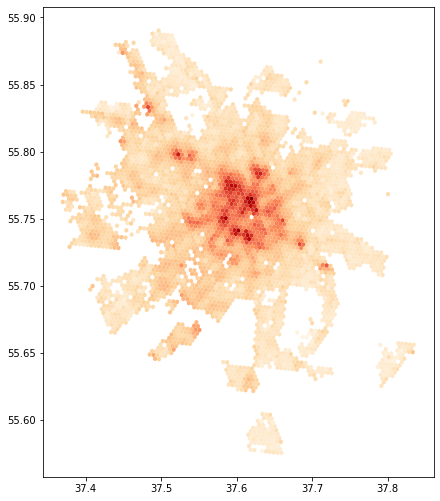

recovery


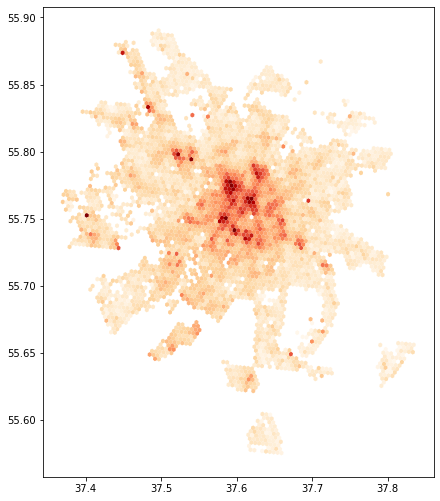

In [209]:
for m in df_median.lock.unique():
    print(m)
    df_median[(df_median.lock==m)&(df_median['land_use']=='commercial')].plot(column='Rich men interest 2.4', cmap='OrRd', figsize=(7,11), vmin=0, vmax=vmax_r)
#     plt.clim(vmin_r,vmax_r)
    plt.show()
#     plt.title('Май-июнь 2020')


In [240]:
vmax_r=df_median[(df_median.lock=='normal')&(df_median['land_use']=='residential')]['Rich men interest 2.4'].max()
vmin_r=df_median[(df_median.lock=='lockdown')&(df_median['land_use']=='residential')]['Rich men interest 2.4'].min()

lockdown


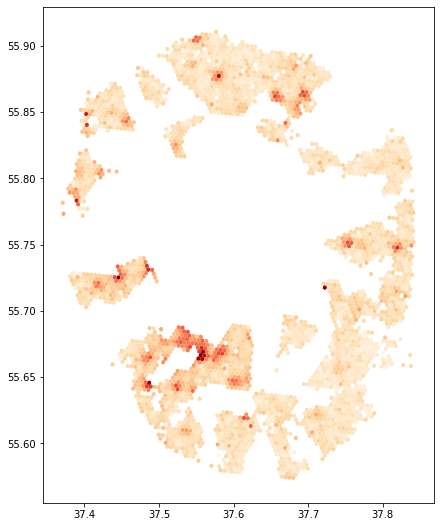

normal


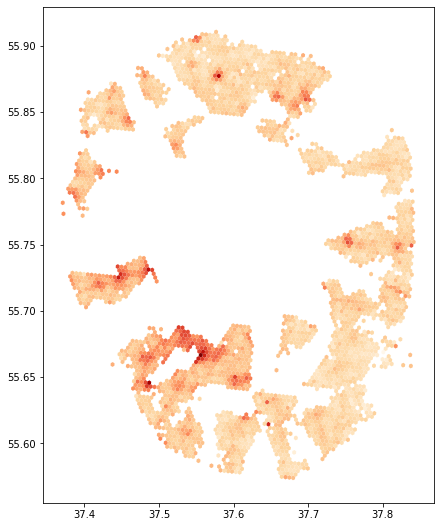

recovery


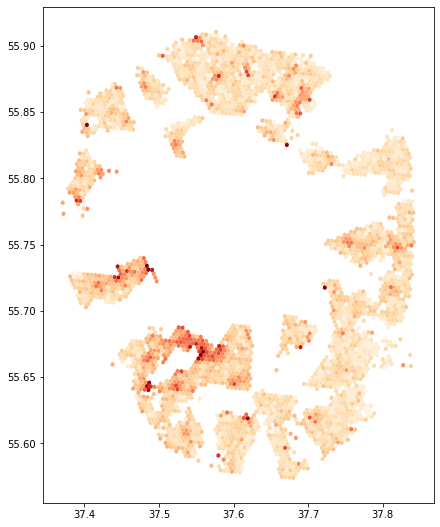

In [241]:
for m in df_median.lock.unique():
    print(m)
    df_median[(df_median.lock==m)&(df_median['land_use']=='residential')].plot(column='Rich men interest 2.4', cmap='OrRd', figsize=(7,11), vmin=0, vmax=vmax_r)
#     plt.clim(vmin_r,vmax_r)
    plt.show()
#     plt.title('Май-июнь 2020')


In [37]:
#All transport

In [38]:
df_loco_analyse['hex_buffer_350']=df_loco_analyse.geometry.buffer(350)

In [20]:
df_hex=gpd.GeoDataFrame(df_loco_analyse[df_loco_analyse['Month']=='2019_01'][['HEX GID','hex_buffer','hex_buffer1000','hex_buffer_350','geometry_hex']],geometry='geometry_hex', crs='epsg:3857')

KeyError: "['hex_buffer_350'] not in index"

In [87]:
df_hex_ws

,HEX GID,intersect,links,link_node ratio,connected_node_ratio,fin_ws_left,hex_buffer
0,891181b41a3ffff,96.0,187.0,1.947917,0.732824,36.775962,"POLYGON ((37.71961 55.59003, 37.72199 55.58897..."
1,891181b41a7ffff,177.0,330.0,1.864407,0.759657,54.529087,"POLYGON ((37.72273 55.59260, 37.72511 55.59154..."
2,891181b41b7ffff,187.0,351.0,1.877005,0.769547,51.053365,"POLYGON ((37.71760 55.59290, 37.71998 55.59184..."
3,891181b41bbffff,62.0,122.0,1.967742,0.746988,15.784615,"POLYGON ((37.71648 55.58745, 37.71886 55.58639..."
4,891181b4427ffff,119.0,219.0,1.840336,0.826389,51.574038,"POLYGON ((37.67723 55.57322, 37.67961 55.57216..."
...,...,...,...,...,...,...,...
6997,8911aa7b6cbffff,380.0,689.0,1.813158,0.822511,69.258654,"POLYGON ((37.48925 55.64471, 37.49163 55.64366..."
6998,8911aa7b6cfffff,255.0,464.0,1.819608,0.882353,66.509135,"POLYGON ((37.49236 55.64729, 37.49474 55.64624..."
6999,8911aa7b6d3ffff,468.0,849.0,1.814103,0.826855,81.754808,"POLYGON ((37.48209 55.64787, 37.48448 55.64682..."
7000,8911aa7b6d7ffff,289.0,528.0,1.826990,0.840116,73.533654,"POLYGON ((37.48520 55.65045, 37.48759 55.64940..."


In [89]:
df_hex['hex_buffer1000']=df_hex['hex_buffer1000'].apply(lambda x: shapely.wkt.loads(x))


In [ ]:
# bus

In [302]:
df_loco_analyse.drop('bus_350', axis=1, inplace=True)

In [42]:
gdf_bus=gpd.read_file('gdf_bus.shp')

df_l_bus=gpd.sjoin(gdf_bus.to_crs('epsg:3857'),df_hex.reset_index().set_geometry('hex_buffer_350'), op='within', how='left')

df_loco_analyse=df_loco_analyse.set_index('HEX GID').join(df_l_bus.groupby('HEX GID').size().to_frame().rename(columns={0:'bus_350'}), how='left').reset_index()
df_loco_analyse['bus_350'].fillna(0, inplace=True)

In [ ]:
# metro

In [43]:
gdf_infrastructure=gpd.read_file('moscow_insfrastructure.geojson')
df_metro=pd.read_csv('metro.csv', index_col=0)

df_metro['global_id']=df_metro['global_id'].astype(str)

df_metro=gpd.GeoDataFrame(df_metro[['global_id','NameOfStation']].merge(gdf_infrastructure[['geometry','global_id']], on='global_id'))

df_l_metro=gpd.sjoin(df_metro.to_crs('epsg:3857'),df_hex.set_geometry('hex_buffer_350'), op='intersects', how='inner')
# df_l_metro1000=gpd.sjoin(df_metro.to_crs('epsg:3857'),df_hex.set_geometry('hex_buffer1000'), op='intersects', how='inner')

df_l_metro=df_l_metro.groupby(['HEX GID','NameOfStation']).size().reset_index()['HEX GID'].value_counts().to_frame()

df_l_metro.reset_index(inplace=True)


df_l_metro.columns=['HEX GID','metro_350']

In [ ]:
#rail station

In [44]:
gdf_rail=gpd.read_file('gdf_rail1.shp')

df_rail=gpd.sjoin(left_df=df_hex.set_geometry('hex_buffer_350').to_crs('epsg:4326'), right_df=gdf_rail[['Caption','geometry']], how='left', op='contains')[['HEX GID','Caption']]

df_rail['rail_350']=df_rail['Caption'].apply(lambda x: 0 if pd.isnull(x) else 1)

df_hex_ws=df_hex_ws.set_index('HEX GID').join(df_rail.groupby('HEX GID')['rail_350'].sum().to_frame(), how='left')

In [75]:
df_hex_ws['rail_350'].value_counts()

0    8465
1     218
2      40
Name: rail_350, dtype: int64

In [45]:
df_loco_analyse=df_loco_analyse.merge(df_l_metro, on='HEX GID', how='left')

In [46]:
df_loco_analyse.shape

(112032, 53)

In [47]:
df_loco_analyse=df_loco_analyse.merge(df_hex_ws.reset_index()[['HEX GID','rail_350']], on='HEX GID', how='left')

In [ ]:
# museums

In [527]:
df_mus=gpd.read_file(r'C:\Users\Intra24\Desktop\travel_museum_startup\список_музеев.csv')
df_mus['geometry']=[ Point (float(i),float(j)) for i,j in zip(df_mus['long'], df_mus['lat'])]

df_mus=gpd.GeoDataFrame(df_mus, geometry='geometry', crs='epsg:4326')

# gdf_mus=gpd.sjoin(left_df=df_normal.set_geometry('hex_buffer_350').to_crs('epsg:4326'), right_df=df_mus, op='intersects')[['HEX GID','name']]

gdf_mus1000=gpd.sjoin(left_df=df_normal.set_geometry('hex_buffer1000').to_crs('epsg:4326'), right_df=df_mus, op='intersects')[['HEX GID','name']]

In [53]:
df_loco_analyse=df_loco_analyse.set_index('HEX GID').join(gdf_mus.groupby('HEX GID').size().to_frame().rename(columns={0:'mus_350'})).reset_index()

In [54]:
df_loco_analyse=df_loco_analyse.set_index('HEX GID').join(gdf_mus1000.groupby('HEX GID').size().to_frame().rename(columns={0:'mus_10'})).reset_index()

In [57]:
df_loco_analyse[['HEX GID', 'index', 'geometry_hex', 'Month',
       'Active youth interest 2.4', 'Families interest 2.4',
       'Fast food interest 2.4', 'Hardworkers interest 2.4',
       'Healthy lifestile interest 2.4', 'Non-residents', 'Residents',
       'Rich men interest 2.4', 'Shopping addicted interest 2.4',
       'Sport and fitness interest 2.4', 'Travellers interest 2.4', 'Users',
       'Visitors', 'Women 18-35 interest 2.4', 'Workers',
       'Active youth interest 2.4/moscow', 'Families interest 2.4/moscow',
       'Fast food interest 2.4/moscow', 'Hardworkers interest 2.4/moscow',
       'Healthy lifestile interest 2.4/moscow', 'Non-residents/moscow',
       'Residents/moscow', 'Rich men interest 2.4/moscow',
       'Shopping addicted interest 2.4/moscow', 'Signals/moscow',
       'Sport and fitness interest 2.4/moscow',
       'Travellers interest 2.4/moscow', 'Users/moscow', 'Visitors/moscow',
       'Women 18-35 interest 2.4/moscow', 'Workers/moscow',
       'Workers/Residents', 'intersect',
       'links', 'link_node ratio', 'connected_node_ratio', 'fin_ws_left',
       'season',  'Residents_moscow', 'index_right', 'en_name',
        'is_living', 'bus_350', 'metro_350',
       'rail_350', 'mus_350', 'mus_1000']].to_file('df_loco_analyse_1710.shp')

In [2]:
df_loco_analyse=gpd.read_file('df_loco_analyse_1710.shp', geometry='geometry_hex', crs='epsg:3857')

In [52]:
df_loco_analyse.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World - 85°S to 85°N
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [3]:
df_loco_analyse.columns=['HEX GID', 'index', 'Month',
       'Active youth interest 2.4', 'Families interest 2.4',
       'Fast food interest 2.4', 'Hardworkers interest 2.4',
       'Healthy lifestile interest 2.4', 'Non-residents', 'Residents',
       'Rich men interest 2.4', 'Shopping addicted interest 2.4',
       'Sport and fitness interest 2.4', 'Travellers interest 2.4', 'Users',
       'Visitors', 'Women 18-35 interest 2.4', 'Workers',
       'Active youth interest 2.4/moscow', 'Families interest 2.4/moscow',
       'Fast food interest 2.4/moscow', 'Hardworkers interest 2.4/moscow',
       'Healthy lifestile interest 2.4/moscow', 'Non-residents/moscow',
       'Residents/moscow', 'Rich men interest 2.4/moscow',
       'Shopping addicted interest 2.4/moscow', 'Signals/moscow',
       'Sport and fitness interest 2.4/moscow',
       'Travellers interest 2.4/moscow', 'Users/moscow', 'Visitors/moscow',
       'Women 18-35 interest 2.4/moscow', 'Workers/moscow',
       'Workers/Residents', 'intersect',
       'links', 'link_node ratio', 'connected_node_ratio', 'fin_ws_left',
       'season',  'Residents_moscow', 'index_right', 'en_name',
        'is_living', 'bus_350', 'metro_350',
       'rail_350', 'mus_350', 'mus_1000', 'geometry_hex']

In [4]:
# df=df_loco_analyse[['HEX GID','geometry','Month','season','intersect','links','link_node','connected_','fin_ws_lef'
#                           ,'mus_350','mus_1000','rail_350','metro_350','bus_350', 'is_living']]

In [222]:
df_model=gpd.GeoDataFrame(df_loco_analyse[['HEX GID','geometry_hex','Month','Active youth interest 2.4/moscow','Rich men interest 2.4', 'Rich men interest 2.4/moscow','Non-residents/moscow','season','intersect','links','link_node ratio','connected_node_ratio','fin_ws_left'
                          ,'Non-residents', 'Residents','Users','mus_350','mus_1000','rail_350','metro_350','bus_350', 'is_living']], geometry='geometry_hex')

In [525]:
df_normal['hex_buffer1000']=df_normal.geometry.buffer(1000)
df_recovery['hex_buffer1000']=df_recovery.geometry.buffer(1000)
df_lock['hex_buffer1000']=df_lock.geometry.buffer(1000)

In [270]:
df_model['season']=df_model['Month'].apply(lambda x: int(x.split('_')[1])//3)

In [223]:
df_model.rename(columns={'fin_ws_left':'fin_ws'},inplace=True)

In [224]:
for i in ['intersect','links','link_node ratio','connected_node_ratio','fin_ws']:
    df_model[i]=df_model[i].astype(float)

<AxesSubplot:ylabel='Frequency'>

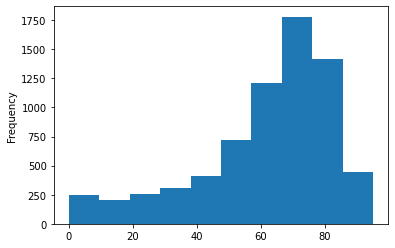

In [225]:
df_model[df_model['Month']=='2019_02'].fin_ws.plot(kind='hist')

In [227]:
# WS level

In [228]:
dict_ws={24:'1.Heavily car-dependent',
49:'2.Car-Dependent',
69:'3.Somewhat Walkable',
89:'4.Very Walkable',
100:'5.Walkers Paradise'}

def get_ws_level(x):
    for k,v in dict_ws.items():
        if x<=k:
            return v

In [29]:
df_model['hex_buffer']=df_model['HEX GID'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, True)))

In [230]:
df_model['fin_ws_level']=df_model['fin_ws'].apply(get_ws_level)

In [231]:
df_model['land_use']=df_model['is_living'].map({1:'residential',0:'commercial'})

In [232]:
df_one_month=gpd.GeoDataFrame(df_model[df_model['Month']=='2019_02'], geometry='hex_buffer', crs='epsg:4326')

In [18]:
from cartoframes.viz import Map, Layer, color_category_style, palettes, histogram_widget

Map(Layer(df_one_month, 
          style=color_category_style('fin_ws_level', cat=['1.Heavily car-dependent',
'2.Car-Dependent',
'3.Somewhat Walkable',
'4.Very Walkable',
'5.Walkers Paradise']),
          title='WalkScore',
          
   ),legend=True
   )

NumExpr defaulting to 8 threads.


In [154]:
ctx.providers.CartoDB.keys()

dict_keys(['Positron', 'PositronNoLabels', 'PositronOnlyLabels', 'DarkMatter', 'DarkMatterNoLabels', 'DarkMatterOnlyLabels', 'Voyager', 'VoyagerNoLabels', 'VoyagerOnlyLabels', 'VoyagerLabelsUnder'])

In [20]:
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
fontprops = fm.FontProperties(size=12)
# fig, ax = plt.subplots()
# ax.imshow(np.random.random((10,10)),extent=[0,100,0,100]) 

In [20]:
df_one_month.fin_ws.max()

95.0

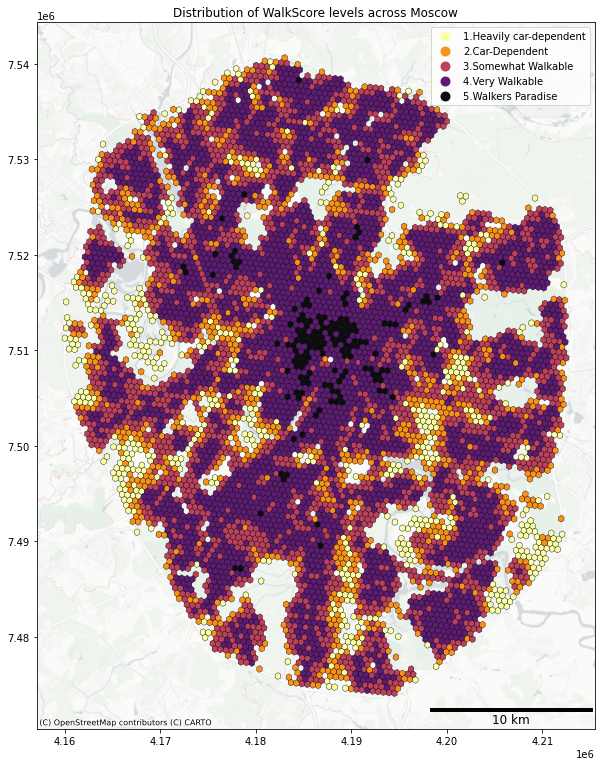

In [21]:
for c in ['inferno_r']:
    fix, ax=plt.subplots(figsize=(10,20))
    ST_TONER = 'http://tile.stamen.com/toner/tileZ/tileX/tileY.png'
    hb=df_one_month.to_crs('epsg:3857').plot(column='fin_ws_level', ax=ax, cmap=c,  cax='right', legend=True, linewidth=0.4,edgecolor='black', alpha=0.95 )
    # cb = fig.colorbar(hb)
    plt.title('Distribution of WalkScore levels across Moscow')
    scalebar = AnchoredSizeBar(ax.transData,
                           17000, '10 km', 'lower right', 
                           pad=0.1,
                           color='black',
                           frameon=False,
                           size_vertical=400,
                           fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
    ax.add_artist(scalebar)
#     ax.add_artist(scalebar)
    ctx.add_basemap(ax, url=ctx.providers.CartoDB.PositronNoLabels)

#     ax.set_xlabel(False)
    plt.show()

In [215]:
df_model[['fin_ws','is_living']].isnull().sum()

fin_ws       0
is_living    0
dtype: int64

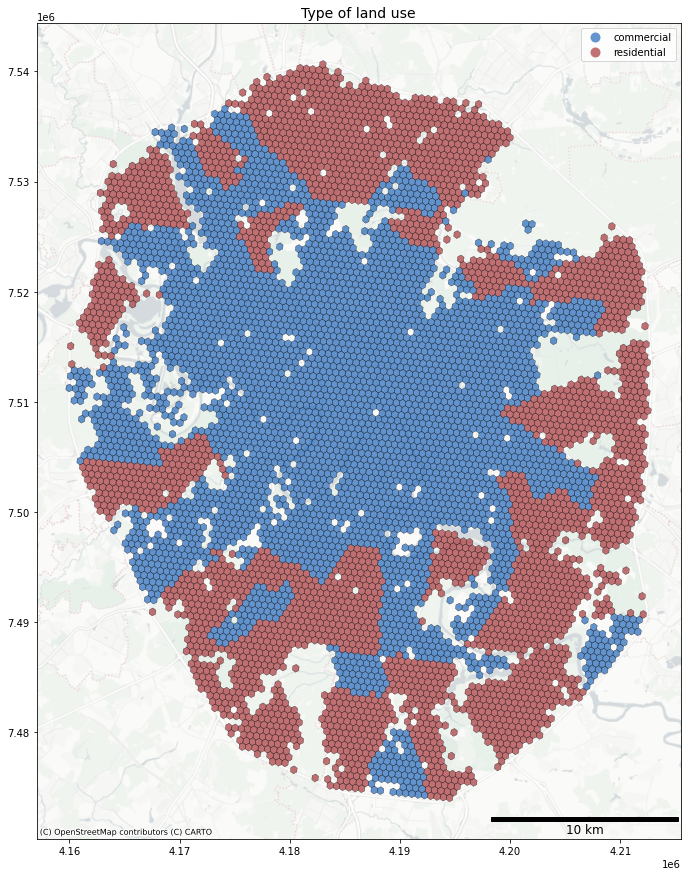

In [46]:
# for c in colors[15:]:
fix, ax=plt.subplots(figsize=(15,15))
ST_TONER = 'http://tile.stamen.com/toner/tileZ/tileX/tileY.png'
hb=df_one_month.to_crs('epsg:3857').plot(column='land_use', ax=ax, cmap='vlag', cax='right',  legend=True,linewidth=0.4,edgecolor='black', alpha=0.7 )
# cb = fig.colorbar(hb)
plt.title('Type of land use', fontsize=14)
scalebar = AnchoredSizeBar(ax.transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
ax.add_artist(scalebar)
#     ax.add_artist(scalebar)
ctx.add_basemap(ax, url=ctx.providers.CartoDB.PositronNoLabels)

#     ax.set_xlabel(False)
plt.show()

In [227]:
colors=['Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'icefire', 'icefire_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'mako', 'mako_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'rocket', 'rocket_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r']

In [285]:
#Transforming seasons

In [273]:
df_model=df_model[['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 'hex_buffer',
       'fin_ws_level', 'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log']]

In [274]:
df_model=df_model.join(pd.get_dummies(df_model['season'], prefix='season_' ))
# df_model.drop('season', axis=1, inplace=True)

In [276]:
df_model=df_model.join(pd.get_dummies(df_model['lock'] ))
# df_model.drop('season', axis=1, inplace=True)

In [288]:
df_model.columns

Index(['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 'hex_buffer',
       'fin_ws_level', 'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log', 'season__0', 'season__1', 'season__2',
       'season__3', 'lockdown', 'normal', 'recovery',
       'y_fitted_Active youth interest 2.4/moscow',
       'resid_Active youth interest 2.4/moscow',
       'y_fitted_Rich men interest 2.4/moscow_log',
       'resid_Rich men interest 2.4/moscow_log'],
      dtype='object')

In [ ]:
df_model[['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 
       'fin_ws_level', 'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log', 'season__0', 'season__1', 'season__2',
       'season__3', 'lockdown', 'normal', 'recovery']].to_file('df_model.geojson', driver='GeoJSON')

In [7]:
df_model=gpd.read_file('df_model.geojson')

In [3]:
df_model.head()

,HEX GID,Month,Active youth interest 2.4/moscow,Rich men interest 2.4,Rich men interest 2.4/moscow,Non-residents/moscow,season,intersect,links,LNR,...,Rich men interest 2.4/moscow_log,Non-residents/moscow_log,season__0,season__1,season__2,season__3,lockdown,normal,recovery,geometry
0,891181b41a3ffff,2019_01,0.588515,1.665797,0.622480,0.0,0,96.0,187.0,1.947917,...,-0.474043,-10.414313,1,0,0,0,0,1,0,POINT (4199233.619 7477379.704)
1,891181b41a3ffff,2019_02,0.724739,1.819859,0.643970,0.0,0,96.0,187.0,1.947917,...,-0.440103,-10.414313,1,0,0,0,0,1,0,POINT (4199233.619 7477379.704)
2,891181b41a3ffff,2019_03,0.693300,1.754296,0.622601,0.0,1,96.0,187.0,1.947917,...,-0.473850,-10.414313,0,1,0,0,0,1,0,POINT (4199233.619 7477379.704)
3,891181b41a3ffff,2019_04,0.647370,1.414825,0.479574,0.0,1,96.0,187.0,1.947917,...,-0.734856,-10.414313,0,1,0,0,0,1,0,POINT (4199233.619 7477379.704)
4,891181b41a3ffff,2019_05,0.659336,1.365429,0.469088,0.0,1,96.0,187.0,1.947917,...,-0.756965,-10.414313,0,1,0,0,0,1,0,POINT (4199233.619 7477379.704)


## Samples for OLS

In [261]:
# y_df=df_model.groupby(['HEX GID','season'])['Active youth interest 2.4/moscow','Rich men interest 2.4/moscow','Non-residents/moscow'].mean()

# df_model.drop('Month', axis=1, inplace=True)

(array([2.2800e+02, 4.6040e+03, 1.4843e+04, 1.0377e+04, 3.2110e+03,
        1.3310e+03, 3.3300e+02, 5.5000e+01, 2.1000e+01, 7.0000e+00]),
 array([0.        , 0.28199144, 0.56398288, 0.84597432, 1.12796575,
        1.40995719, 1.69194863, 1.97394007, 2.25593151, 2.53792295,
        2.81991439]),
 <BarContainer object of 10 artists>)

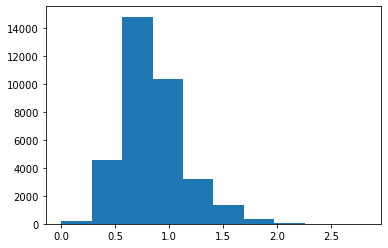

In [195]:
plt.hist(df_model['Active youth interest 2.4/moscow'])

(array([1.7396e+04, 1.3524e+04, 2.6930e+03, 9.4100e+02, 3.1000e+02,
        9.8000e+01, 3.1000e+01, 1.4000e+01, 2.0000e+00, 1.0000e+00]),
 array([0.        , 0.60518944, 1.21037888, 1.81556831, 2.42075775,
        3.02594719, 3.63113663, 4.23632606, 4.8415155 , 5.44670494,
        6.05189438]),
 <BarContainer object of 10 artists>)

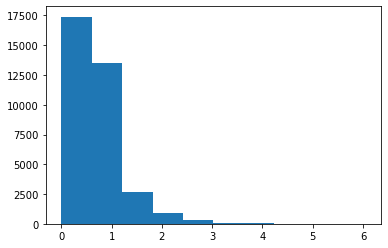

In [196]:
plt.hist(df_model['Rich men interest 2.4/moscow'])

In [277]:
df_model['Rich men interest 2.4/moscow_log']=df_model['Rich men interest 2.4/moscow'].apply(lambda x:np.log(x)if x!=0 else np.log(0.0028))

df_model['Non-residents/moscow_log']=df_model['Non-residents/moscow'].apply(lambda x: np.log(x)if x!=0 else np.log(0.00003))

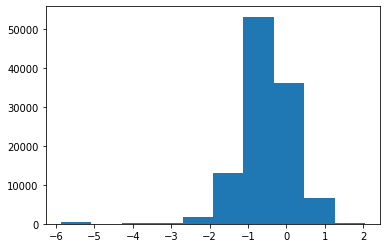

In [246]:
plt.hist(df_model['Rich men interest 2.4/moscow_log']);

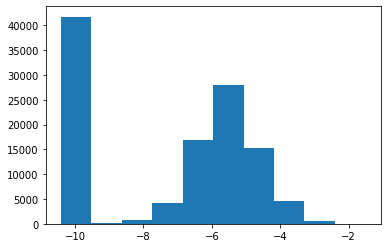

In [247]:
plt.hist(df_model['Non-residents/moscow_log']);

In [36]:
df_model.groupby('lock')['Rich men interest 2.4/moscow_log','Active youth interest 2.4/moscow'].median()

,Rich men interest 2.4/moscow_log,Active youth interest 2.4/moscow
lock,,
lockdown,-0.510651,0.840073
normal,-0.481304,0.811253
recovery,-0.481423,0.820555


KeyboardInterrupt: 

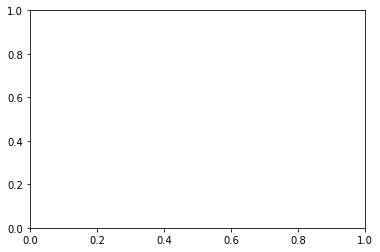

In [43]:
sns.distplot(df_model['Rich men interest 2.4/moscow_log']);

In [ ]:
df_model

In [25]:
df_model.columns

Index(['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4/moscow', 'Non-residents/moscow', 'season',
       'intersect', 'links', 'link_node ratio', 'connected_node_ratio',
       'fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350', 'bus_350',
       'is_living', 'hex_buffer', 'fin_ws_level',
       'Rich men interest 2.4/moscow_log', 'Non-residents/moscow_log'],
      dtype='object')

In [281]:
df_model.fillna(0, inplace=True)

In [282]:
df_model.columns

Index(['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 'hex_buffer',
       'fin_ws_level', 'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log', 'season__0', 'season__1', 'season__2',
       'season__3', 'lockdown', 'normal', 'recovery'],
      dtype='object')

In [7]:
df_model.rename(columns={'connected_node_ratio':'CNR'},inplace=True)

In [8]:
df_model.rename(columns={'link_node ratio':'LNR'},inplace=True)

In [ ]:
df_model

In [9]:
x_full=df_model[[ 'intersect','fin_ws',
        'mus_350', 'mus_1000', 'rail_350', 'metro_350', 'bus_350','season__0','lockdown','normal',
       'season__1', 'season__2', 'is_living','links', 'LNR', 'CNR']]

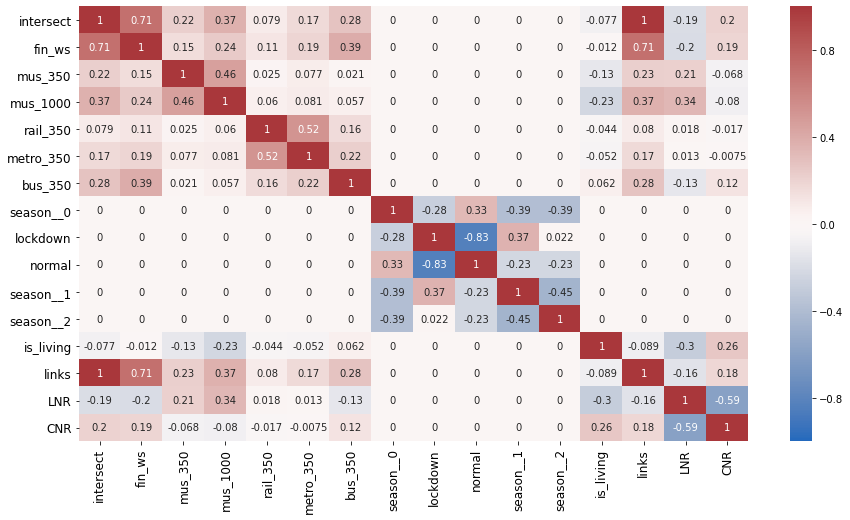

In [10]:
fig, ax=plt.subplots(figsize=(15,8))
sns.heatmap(x_full.corr(method='spearman'), annot=True, cmap='vlag', vmin=-1, vmax=1);
plt.xticks(size=12);
plt.yticks(size=12);

In [11]:
x_full['1']=1

In [285]:
x_full.drop('links', axis=1, inplace=True)

In [266]:
x_full.columns

Index(['intersect', 'fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350',
       'bus_350', 'season__0', 'situation_lockdown', 'situation_normal',
       'season__1', 'season__2', 'season__corona', 'is_living', 'LNR', 'CNR',
       '1'],
      dtype='object')

In [304]:
d_vif=pd.Series(dict([(x_full.columns[i],variance_inflation_factor(x_full.values, i)) for i in range(x_full.shape[1])])).to_frame(name='vif')
d_vif

,vif
intersect,19.962641
fin_ws,1.428958
mus_350,1.636012
mus_1000,8.007268
rail_350,1.369924
metro_350,1.437739
bus_350,1.267611
season__0,2.250000
lockdown,3.750000
normal,3.846154


In [305]:
d_vif.to_csv('d_vif.csv')

In [286]:
dic_model=dict()
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow_log']:
#     x_full['one']=1
    y=df_model[y_col]
    est = sm.OLS(y, x_full)
    est2 = est.fit()
    dic_model[y_col]=est2
    print(est2.summary())
    est2ted_y = est2.fittedvalues
    #  model residuals
    model_residuals = est2.resid
    df_model['y_fitted'+'_'+y_col]=est2ted_y
    df_model['resid'+'_'+y_col]=model_residuals

                                   OLS Regression Results                                   
Dep. Variable:     Active youth interest 2.4/moscow   R-squared:                       0.312
Model:                                          OLS   Adj. R-squared:                  0.312
Method:                               Least Squares   F-statistic:                     3386.
Date:                              Sun, 20 Dec 2020   Prob (F-statistic):               0.00
Time:                                      01:42:07   Log-Likelihood:                -8493.7
No. Observations:                            112032   AIC:                         1.702e+04
Df Residuals:                                112016   BIC:                         1.717e+04
Df Model:                                        15                                         
Covariance Type:                          nonrobust                                         
                 coef    std err          t      P>|t|      [0.025    

In [15]:
x_act=x_full[[ 'intersect','fin_ws',
        'mus_350', 'mus_1000', 'rail_350', 'metro_350','season__0','lockdown','normal',
       'season__1', 'season__2', 'is_living',  'CNR','1']] # - lnr and bus

d_vif_act=pd.Series(dict([(x_act.columns[i],variance_inflation_factor(x_act.values, i)) for i in range(x_act.shape[1])])).to_frame(name='vif')
d_vif_act

# 

,vif
intersect,4.991839
fin_ws,1.216909
mus_350,1.635071
mus_1000,5.596427
rail_350,1.354745
metro_350,1.386521
season__0,2.250000
lockdown,3.750000
normal,3.846154
season__1,2.688301


In [306]:
d_vif_act.to_csv('d_vif_act.csv')

In [16]:
dic_model=dict()
for y_col in ['Active youth interest 2.4/moscow']:
#     x_full['one']=1
    y=df_model[y_col]
    est = sm.OLS(y, x_act)
    est2 = est.fit()
    dic_model[y_col]=est2
    print(est2.summary())
    est2ted_y = est2.fittedvalues
    #  model residuals
    model_residuals = est2.resid
    df_model['y_fitted'+'_'+y_col]=est2ted_y
    df_model['resid'+'_'+y_col]=model_residuals

                                   OLS Regression Results                                   
Dep. Variable:     Active youth interest 2.4/moscow   R-squared:                       0.312
Model:                                          OLS   Adj. R-squared:                  0.312
Method:                               Least Squares   F-statistic:                     3906.
Date:                              Mon, 04 Jan 2021   Prob (F-statistic):               0.00
Time:                                      15:27:00   Log-Likelihood:                -8495.8
No. Observations:                            112032   AIC:                         1.702e+04
Df Residuals:                                112018   BIC:                         1.715e+04
Df Model:                                        13                                         
Covariance Type:                          nonrobust                                         
                 coef    std err          t      P>|t|      [0.025    

In [12]:
x_rich=x_full[[ 'intersect','fin_ws',
        'mus_350', 'mus_1000',  'metro_350', 'bus_350','season__0','lockdown',
       'season__1', 'season__2', 'is_living', 'LNR', 'CNR','1']]

d_vif_rich=pd.Series(dict([(x_rich.columns[i],variance_inflation_factor(x_rich.values, i)) for i in range(x_rich.shape[1])])).to_frame(name='vif')
d_vif_rich

d_vif_rich.to_csv('d_vif_rich1.csv')

In [297]:
dic_model1=dict()
for y_col in [ 'Rich men interest 2.4/moscow_log']:
    y=df_model[y_col]
    est = sm.OLS(y, x_rich)
    est2 = est.fit()
    dic_model1[y_col]=est2
    print(est2.summary())
    est2ted_y = est2.fittedvalues
    #  model residuals
    model_residuals = est2.resid
    df_model['y_fitted'+'_'+y_col+'_1']=est2ted_y
    df_model['resid'+'_'+y_col+'_1']=model_residuals

                                   OLS Regression Results                                   
Dep. Variable:     Rich men interest 2.4/moscow_log   R-squared:                       0.210
Model:                                          OLS   Adj. R-squared:                  0.210
Method:                               Least Squares   F-statistic:                     2296.
Date:                              Mon, 21 Dec 2020   Prob (F-statistic):               0.00
Time:                                      15:32:09   Log-Likelihood:            -1.0487e+05
No. Observations:                            112032   AIC:                         2.098e+05
Df Residuals:                                112018   BIC:                         2.099e+05
Df Model:                                        13                                         
Covariance Type:                          nonrobust                                         
                 coef    std err          t      P>|t|      [0.025    

In [13]:
x_rich=x_full[[ 'intersect','fin_ws',
        'mus_350', 'mus_1000',  'metro_350', 'bus_350','season__0','lockdown',
       'season__1', 'season__2', 'is_living',  'CNR','1']]

d_vif_rich=pd.Series(dict([(x_rich.columns[i],variance_inflation_factor(x_rich.values, i)) for i in range(x_rich.shape[1])])).to_frame(name='vif')
d_vif_rich

#

,vif
intersect,4.993812
fin_ws,1.364942
mus_350,1.634274
mus_1000,5.596359
metro_350,1.117841
bus_350,1.253550
season__0,2.250000
lockdown,1.218750
season__1,2.681250
season__2,2.475000


In [14]:
 d_vif_rich.to_csv('d_vif_rich2.csv')

In [17]:
dic_model1=dict()
for y_col in [ 'Rich men interest 2.4/moscow_log']:
    y=df_model[y_col]
    est = sm.OLS(y, x_rich)
    est2 = est.fit()
    dic_model1[y_col]=est2
    print(est2.summary())
    est2ted_y = est2.fittedvalues
    #  model residuals
    model_residuals = est2.resid
    df_model['y_fitted'+'_'+y_col]=est2ted_y
    df_model['resid'+'_'+y_col]=model_residuals

                                   OLS Regression Results                                   
Dep. Variable:     Rich men interest 2.4/moscow_log   R-squared:                       0.210
Model:                                          OLS   Adj. R-squared:                  0.210
Method:                               Least Squares   F-statistic:                     2486.
Date:                              Mon, 04 Jan 2021   Prob (F-statistic):               0.00
Time:                                      15:27:39   Log-Likelihood:            -1.0488e+05
No. Observations:                            112032   AIC:                         2.098e+05
Df Residuals:                                112019   BIC:                         2.099e+05
Df Model:                                        12                                         
Covariance Type:                          nonrobust                                         
                 coef    std err          t      P>|t|      [0.025    

In [307]:
est2.aic

209780.8329339648

In [302]:
df_model.columns

Index(['HEX GID', 'geometry_hex', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 'hex_buffer',
       'fin_ws_level', 'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log', 'season__0', 'season__1', 'season__2',
       'season__3', 'lockdown', 'normal', 'recovery',
       'y_fitted_Active youth interest 2.4/moscow',
       'resid_Active youth interest 2.4/moscow',
       'y_fitted_Rich men interest 2.4/moscow_log',
       'resid_Rich men interest 2.4/moscow_log',
       'y_fitted_Rich men interest 2.4/moscow_log_1',
       'resid_Rich men interest 2.4/moscow_log_1',
       'y_fitted_Rich men interest 2.4/moscow_log_2',
       'resid_Rich men interest 2.4/moscow_log_2'],
      dtype

In [267]:
from statsmodels.compat import lzip
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms

In [271]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif

In [293]:
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow_log','Non-residents/moscow_log']:
    name = ['Jarque-Bera', 'Chi^2 two-tail prob.', 'Skew', 'Kurtosis']
    test = sms.jarque_bera(df_model['resid_'+y_col+'_1'])
    print(y_col,lzip(name, test))

Active youth interest 2.4/moscow [('Jarque-Bera', 24019.098171403602), ('Chi^2 two-tail prob.', 0.0), ('Skew', 0.4268426417806868), ('Kurtosis', 5.101594848632079)]
Rich men interest 2.4/moscow_log [('Jarque-Bera', 1147776.6221711596), ('Chi^2 two-tail prob.', 0.0), ('Skew', -2.1709351076764825), ('Kurtosis', 18.06751619840909)]
Non-residents/moscow_log [('Jarque-Bera', 7308.521401794968), ('Chi^2 two-tail prob.', 0.0), ('Skew', -0.3966542940846358), ('Kurtosis', 2.0323606662561238)]


In [270]:
dic_model[y_col].model.exog

array([[ 96.        ,   0.        ,   0.        , ...,   1.94791667,
          0.73282443,   1.        ],
       [ 96.        ,   0.        ,   0.        , ...,   1.94791667,
          0.73282443,   1.        ],
       [ 96.        ,   0.        ,   0.        , ...,   1.94791667,
          0.73282443,   1.        ],
       ...,
       [564.        ,   0.        ,   0.        , ...,   1.81560284,
          0.8       ,   1.        ],
       [564.        ,   0.        ,   0.        , ...,   1.81560284,
          0.8       ,   1.        ],
       [564.        ,   0.        ,   0.        , ...,   1.81560284,
          0.8       ,   1.        ]])

In [219]:
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow']:
    name = ['Jarque-Bera', 'Chi^2 two-tail prob.', 'Skew', 'Kurtosis']
    test = sms.jarque_bera(df_model['resid_'+y_col])
    lzip(name, test)
    print(y_col,lzip(name, test))

Active youth interest 2.4/moscow [('Jarque-Bera', 2461.5815701211072), ('Chi^2 two-tail prob.', 0.0), ('Skew', 0.36600107921143843), ('Kurtosis', 4.073141349896081)]
Rich men interest 2.4/moscow [('Jarque-Bera', 86907.74672303515), ('Chi^2 two-tail prob.', 0.0), ('Skew', 1.5558446929388758), ('Kurtosis', 10.06358624726911)]


(array([1.7396e+04, 1.3524e+04, 2.6930e+03, 9.4100e+02, 3.1000e+02,
        9.8000e+01, 3.1000e+01, 1.4000e+01, 2.0000e+00, 1.0000e+00]),
 array([0.        , 0.60518944, 1.21037888, 1.81556831, 2.42075775,
        3.02594719, 3.63113663, 4.23632606, 4.8415155 , 5.44670494,
        6.05189438]),
 <BarContainer object of 10 artists>)

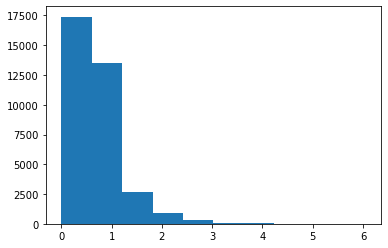

In [220]:
plt.hist(df_model['Rich men interest 2.4/moscow'])

In [312]:
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow','Non-residents/moscow_log']:
    name = ['Lagrange multiplier statistic', 'p-value',
            'f-value', 'f p-value']
    test = sms.het_breuschpagan(dic_model[y_col].resid, dic_model[y_col].model.exog)
    print(y_col)
    print(lzip(name, test))

Active youth interest 2.4/moscow
[('Lagrange multiplier statistic', 2436.7371687948676), ('p-value', 0.0), ('f-value', 218.1709866827172), ('f p-value', 0.0)]
Rich men interest 2.4/moscow
[('Lagrange multiplier statistic', 3851.9540878092116), ('p-value', 0.0), ('f-value', 360.54581640263393), ('f p-value', 0.0)]
Non-residents/moscow_log
[('Lagrange multiplier statistic', 1231.7176594706568), ('p-value', 2.5566292124282587e-256), ('f-value', 106.34649430938445), ('f p-value', 4.896895156303829e-261)]


In [298]:
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow','Non-residents/moscow_log']:
    for l in df_model['fin_ws_level'].unique():
        for v in [0,1]:
            ss_res=sum(df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)]['resid_'+y_col].apply(lambda x: x*x))
            print(ss_res)
            y_mean=df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)][y_col].mean()
            ss_tot=sum(df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)][y_col].apply(lambda y: (y-y_mean)*(y-y_mean)))
            print(ss_tot)
            try:
                r2=1-ss_res/ss_tot
                print(y_col,l,v,r2)
            except:
                print('no solution')

228.5671077634485
260.5697396595414
Active youth interest 2.4/moscow 2.Car-Dependent 0 0.12281791407516218
182.54184981531833
153.96797192652926
Active youth interest 2.4/moscow 2.Car-Dependent 1 -0.18558325820141364
420.5588546716778
483.1953649501392
Active youth interest 2.4/moscow 3.Somewhat Walkable 0 0.1296297829448857
416.4456055430628
443.8546232350763
Active youth interest 2.4/moscow 3.Somewhat Walkable 1 0.061752241065419766
22.62011740743253
20.754870128142183
Active youth interest 2.4/moscow 1.Heavily car-dependent 0 -0.0898703421305056
0
0
no solution
379.88062995621186
573.9065949071525
Active youth interest 2.4/moscow 4.Very Walkable 0 0.3380793436993531
54.15010732681537
46.238617873759715
Active youth interest 2.4/moscow 4.Very Walkable 1 -0.17110133946164963
552.25282283106
555.0267720592077
Rich men interest 2.4/moscow 2.Car-Dependent 0 0.0049978656306182145
202.6816731424109
152.19999379272502
Rich men interest 2.4/moscow 2.Car-Dependent 1 -0.3316799041295284
1125.3

In [282]:
df_model['y_fitted'+'_'+y_col]

HEX GID
891181b41a3ffff   -8.056860
891181b41a3ffff   -7.969013
891181b41a3ffff   -8.361977
891181b41a3ffff   -8.390660
891181b41a3ffff   -8.567899
                     ...   
8911aa7b6dbffff   -6.514282
8911aa7b6dbffff   -6.426435
8911aa7b6dbffff   -6.819399
8911aa7b6dbffff   -6.848082
8911aa7b6dbffff   -7.025321
Name: y_fitted_Non-residents/moscow_log, Length: 35010, dtype: float64

In [319]:
from cartoframes.viz import Map, Layer, color_continuous_style, palettes, histogram_widget

Map(Layer(df_model.to_crs('epsg:4326').set_geometry('hex_buffer'), 
          style=color_continuous_style('resid_Active youth interest 2.4/moscow_1', palette='Geyser'),
          title='residuals',
          time='Month',
          widgets=histogram_widget('resid_Active youth interest 2.4/moscow_1', title='Residuals', description=None, footer=None, read_only=False, buckets=10)
         )
   )


TypeError: __init__() got an unexpected keyword argument 'time'

In [ ]:
from cartoframes.viz import Map, Layer, color_continuous_style, palettes, histogram_widget

Map(Layer(df_model[df_model.Month==m].to_crs('epsg:4326').set_geometry('hex_buffer'), 
          style=color_continuous_style('resid_Active youth interest 2.4/moscow_1', palette='Geyser'),
          title='residuals',
          widgets=histogram_widget('resid_Active youth interest 2.4/moscow_1', title='Distribution of Residuals', description=None, footer=None, read_only=False, buckets=10)
     ),
    basemap='PositronNoLabels'
    ,
    title='Active youth model residuals'
   )


In [ ]:
Map(
    Layer(
        df_model.to_crs('epsg:4326').set_geometry('hex_buffer'),
        style=animation_style('date_column', color='blue', size=20, duration=20),
        widgets=animation_widget(title='Month')
    )
)

In [349]:
from cartoframes.viz import Map, Layer, color_continuous_legend, color_continuous_style, formula_widget, time_series_widget, basemaps, basic_style

Map (
    Layer(
        df_model.to_crs('epsg:4326').set_geometry('hex_buffer'),
        style=color_continuous_style('Rich men interest 2.4/moscow', size=4, stroke_width=0, animate='Month_n'),
        legends=color_continuous_legend(
            title='Rich men proportion',
            description='descr',
            footer='Source: Locomizer calculations'
            
        ),
        encode_data=False
#         widgets=[
#             formula_widget('Rich men interest 2.4/moscow', operation='sum', title='Proportion of Rich men interest ')
# #             time_series_widget('Rich men interest 2.4/moscow', title='Rich men interest')
#         ],
    ),
    
#     basemap=basemaps.darkmatter,
#     show_info=True,
    viewport={'zoom': 2.5, 'lat': 37.572586, 'lng': 55.638529}
)

TypeError: Object of type date is not JSON serializable

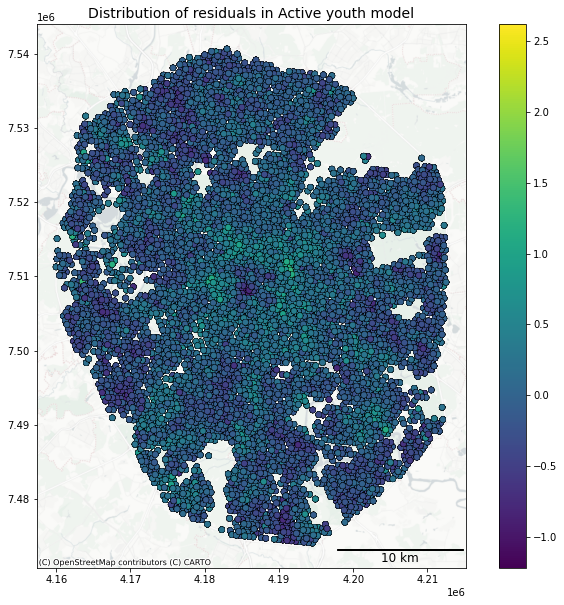

In [365]:
fig,ax=plt.subplots(figsize=(12,10))
df_model.plot(column='resid_Active youth interest 2.4/moscow',legend=True, ax=ax,linewidth=0.3,edgecolor='black' );
scalebar = AnchoredSizeBar(ax.transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=200,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
ax.add_artist(scalebar)
plt.title('Distribution of residuals in Active youth model', fontsize=14)
#     ax.add_artist(scalebar)
ctx.add_basemap(ax, url=ctx.providers.CartoDB.PositronNoLabels)

#     ax.set_xlabel(False)
plt.show()

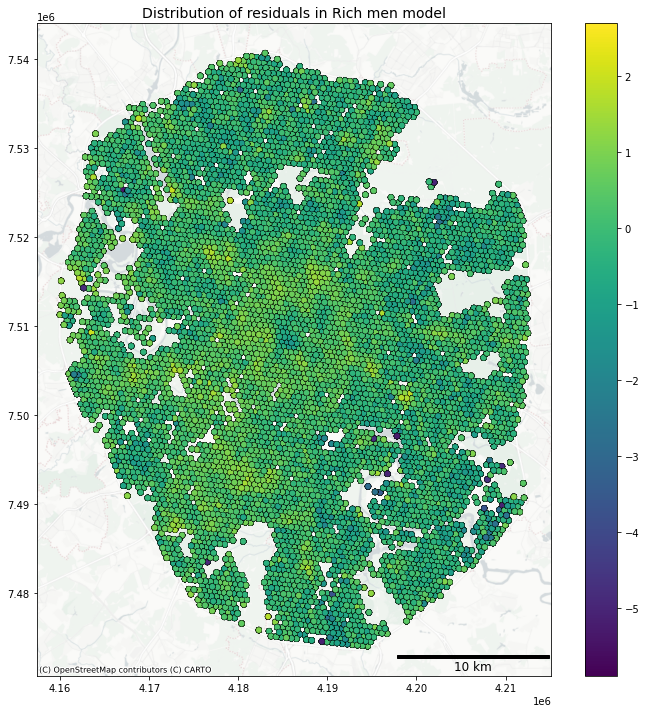

In [366]:
fig,ax=plt.subplots(figsize=(12,12))
df_model.plot(column='resid_Rich men interest 2.4/moscow_log',legend=True, ax=ax,linewidth=0.3,edgecolor='black' );
scalebar = AnchoredSizeBar(ax.transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
ax.add_artist(scalebar)
plt.title('Distribution of residuals in Rich men model', fontsize=14)
#     ax.add_artist(scalebar)
ctx.add_basemap(ax, url=ctx.providers.CartoDB.PositronNoLabels)

#     ax.set_xlabel(False)
plt.show()

In [ ]:
# Global Moran for each model residuals

In [27]:
df_model['HEX GID'].apply ()

Index(['HEX GID', 'Month', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow', 'season', 'intersect', 'links', 'LNR', 'CNR',
       'fin_ws', 'Non-residents', 'Residents', 'Users', 'mus_350', 'mus_1000',
       'rail_350', 'metro_350', 'bus_350', 'is_living', 'fin_ws_level',
       'land_use', 'lock', 'Rich men interest 2.4/moscow_log',
       'Non-residents/moscow_log', 'season__0', 'season__1', 'season__2',
       'season__3', 'lockdown', 'normal', 'recovery', 'geometry',
       'y_fitted_Active youth interest 2.4/moscow',
       'resid_Active youth interest 2.4/moscow',
       'y_fitted_Rich men interest 2.4/moscow_log',
       'resid_Rich men interest 2.4/moscow_log'],
      dtype='object')

In [29]:
get_hex_buffer(df_model)

In [31]:
# qW = Queen.from_dataframe(df_model.set_geometry('hex_buffer'), geom_col='hex_buffer')

for col in ['resid_Active youth interest 2.4/moscow','resid_Rich men interest 2.4/moscow_log']:
    g_hex_moran =Moran(df_model[col], qW, permutations=9999);

    #We calculate Morans autcorrelation coefficient

    print(col, g_hex_moran.I);

resid_Active youth interest 2.4/moscow 0.5145482500313562
resid_Rich men interest 2.4/moscow_log 0.4012255370888112


In [ ]:
Moran(df_model[col], qW, permutations=9999)

In [2]:
df_model=gpd.read_file('df_model.shp')

In [3]:
df_model.head()

,HEX GID,season,Active you,Rich men i,Non-reside,intersect,fin_ws,mus_350,mus_1000,rail_350,...,resid_Rich,y_fitted_N,resid_Non-,local_r2,local_r2_y,gwr_resid_,local_r2_r,gwr_resi_1,fin_ws_lev,geometry
0,891181b41a3ffff,0,0.718732,0.670697,0.0,96.0,40.562197,0.0,0.0,0.0,...,0.279776,-8.056860,-3.456065,0.595689,0.595689,0.010154,0.392266,0.039531,2.Car-Dependent,POINT (4199233.619 7477379.704)
1,891181b41a3ffff,1,0.700308,0.543689,0.0,96.0,40.562197,0.0,0.0,0.0,...,0.153781,-7.969013,-3.543912,0.595689,0.595689,0.001024,0.392266,-0.009690,2.Car-Dependent,POINT (4199233.619 7477379.704)
2,891181b41a3ffff,2,0.723864,0.624387,0.0,96.0,40.562197,0.0,0.0,0.0,...,0.263308,-8.361977,-3.150948,0.595689,0.595689,0.001274,0.392266,0.027363,2.Car-Dependent,POINT (4199233.619 7477379.704)
3,891181b41a3ffff,3,0.734416,0.608452,0.0,96.0,40.562197,0.0,0.0,0.0,...,0.262157,-8.390660,-3.122266,0.595689,0.595689,0.016927,0.392266,0.006653,2.Car-Dependent,POINT (4199233.619 7477379.704)
4,891181b41a3ffff,corona,0.648932,0.551410,0.0,96.0,40.562197,0.0,0.0,0.0,...,0.104653,-8.567899,-2.945027,0.595689,0.595689,-0.061931,0.392266,-0.112288,2.Car-Dependent,POINT (4199233.619 7477379.704)


In [4]:
df_model.columns

Index(['HEX GID', 'season', 'Active you', 'Rich men i', 'Non-reside',
       'intersect', 'fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350',
       'bus_350', 'season__1', 'season__2', 'season__3', 'season__co',
       'is_living', 'Non-resi_1', 'y_fitted_A', 'resid_Acti', 'y_fitted_R',
       'resid_Rich', 'y_fitted_N', 'resid_Non-', 'local_r2', 'local_r2_y',
       'gwr_resid_', 'local_r2_r', 'gwr_resi_1', 'fin_ws_lev', 'geometry'],
      dtype='object')

In [4]:
df_model.columns=['HEX GID', 'season',
       'Active youth interest 2.4/moscow',  'Rich men interest 2.4/moscow', 'Non-residents/moscow_log',
      
       'intersect','fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350',
       'bus_350', 'season__1', 'season__2', 'season__3', 'season__co',
       'is_living', 'Non-resi_1', 'y_fitted_Active youth interest 2.4/moscow', 'resid_Active youth interest 2.4/moscow', 'y_fitted_Rich men interest 2.4/moscow',
       'resid_Rich men interest 2.4/moscow', 'y_fitted_Non-residents/moscow_log', 'resid_Non-residents/moscow_log', 'local_r2', 'local_r2_y',
       'gwr_resid_youth', 'local_r2_rich', 'gwr_resid_rich', 'fin_ws_level',  'geometry_hex']

In [ ]:
### GWR

In [ ]:
# Считаем для двух периодов. До корона и посткорона

In [11]:
# df_model=gpd.GeoDataFrame(df_model, geometry='geometry_hex', crs='epsg:3857')

In [39]:
df_model.shape

(35010, 31)

In [55]:
df_model['time']=[ str(j) if i=='normal' else i for i, j in zip(df_model['lock'], df_model['Month'])]

In [60]:
df_model['year']=df_model['Month'].apply(lambda x: x.split('_')[0])
df_model['month_num']=df_model['Month'].apply(lambda x: x.split('_')[1])

In [101]:
pd.pivot_tabledf_model.groupby(['HEX GID','month_num', 'year'])['Rich men interest 2.4/moscow_log'].mean().reset_index()

HEX GID          month_num  year
891181b41a3ffff  01         2019   -0.474043
                            2020   -0.185207
                 02         2019   -0.440103
                            2020   -0.535453
                 03         2019   -0.473850
                                      ...   
8911aa7b6dbffff  07         2019    0.530675
                            2020    0.742853
                 08         2019   -0.052736
                 09         2019    0.682699
                 10         2019    0.179749
Name: Rich men interest 2.4/moscow_log, Length: 112032, dtype: float64

01


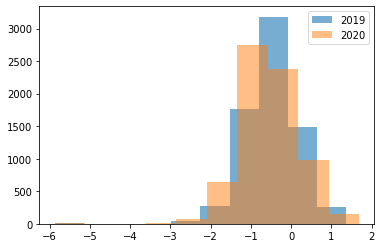

02


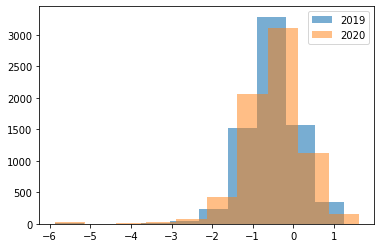

03


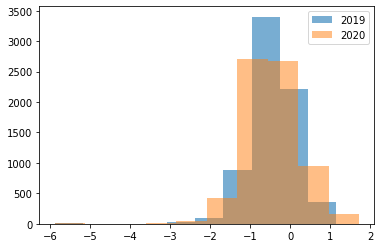

04


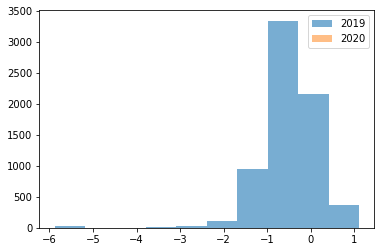

05


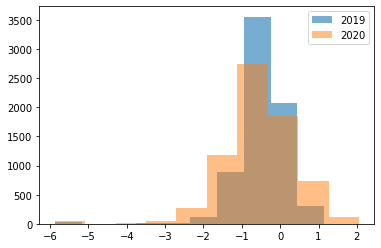

06


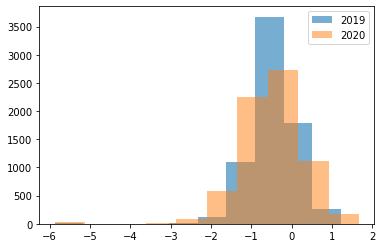

07


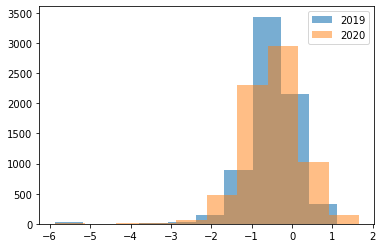

In [99]:
for k in df_model['month_num'].unique()[:7]:
    print(k)
    plt.hist(df_model[(df_model['month_num']==k)&(df_model['year']=='2019')]['Rich men interest 2.4/moscow_log'],alpha=0.6)
    plt.hist(df_model[(df_model['month_num']==k)&(df_model['year']=='2020')]['Rich men interest 2.4/moscow_log'], alpha=0.5)
    plt.legend(['2019','2020'])
    plt.show()

01


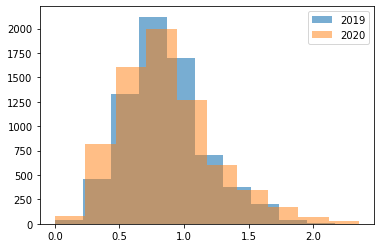

02


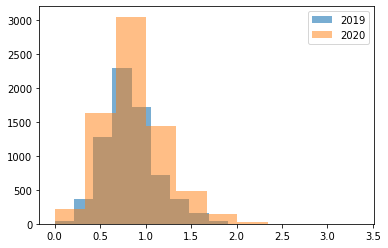

03


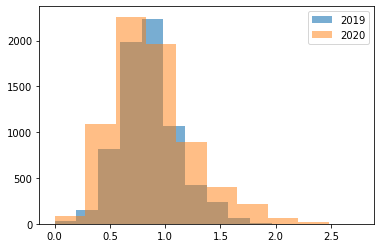

04


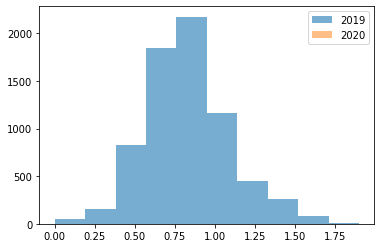

05


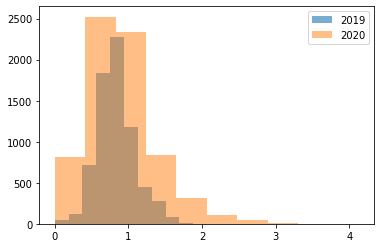

06


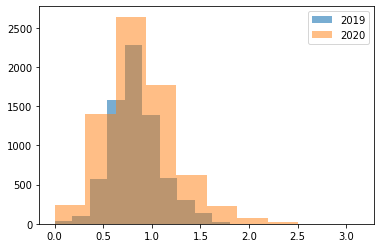

07


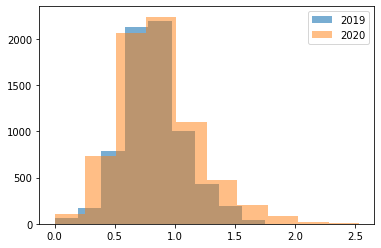

08


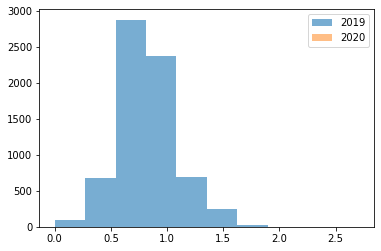

In [100]:
for k in df_model['month_num'].unique()[:8]:
    print(k)
    plt.hist(df_model[(df_model['month_num']==k)&(df_model['year']=='2019')]['Active youth interest 2.4/moscow'],alpha=0.6)
    plt.hist(df_model[(df_model['month_num']==k)&(df_model['year']=='2020')]['Active youth interest 2.4/moscow'], alpha=0.5)
    plt.legend(['2019','2020'])
    plt.show()

In [103]:
df_rich_comp=pd.pivot_table(df_model, index=['HEX GID','month_num'], columns='year', values='Rich men interest 2.4/moscow_log', aggfunc='mean')
df_youth_comp=pd.pivot_table(df_model, index=['HEX GID','month_num'], columns='year', values='Active youth interest 2.4/moscow', aggfunc='mean')

In [133]:
df_rich_comp['dif']=df_rich_comp['2020']-df_rich_comp['2019']
df_youth_comp['dif']=df_youth_comp['2020']-df_youth_comp['2019']

In [134]:
d_rich=pd.pivot_table(df_rich_comp.reset_index(), index='HEX GID', columns='month_num', values='dif').reset_index()
d_youth=pd.pivot_table(df_youth_comp.reset_index(), index='HEX GID', columns='month_num', values='dif').reset_index()

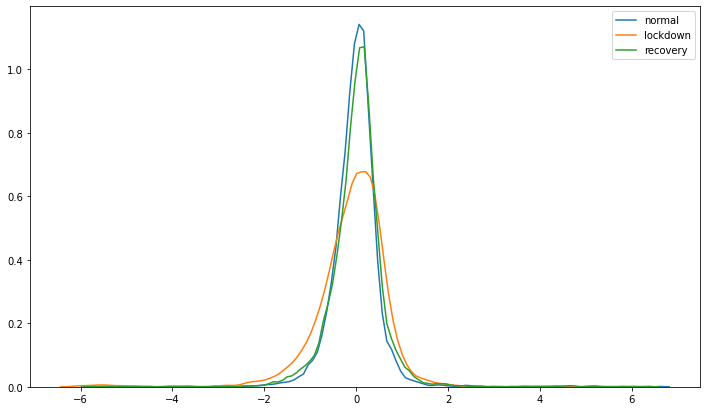

In [171]:
plt.figure(figsize=(12,7))

sns.kdeplot(d_rich['03']);
sns.kdeplot(d_rich['05']);
# sns.distplot(d_youth['06']);
sns.kdeplot(d_rich['07']);
plt.legend(['normal','lockdown','recovery'])

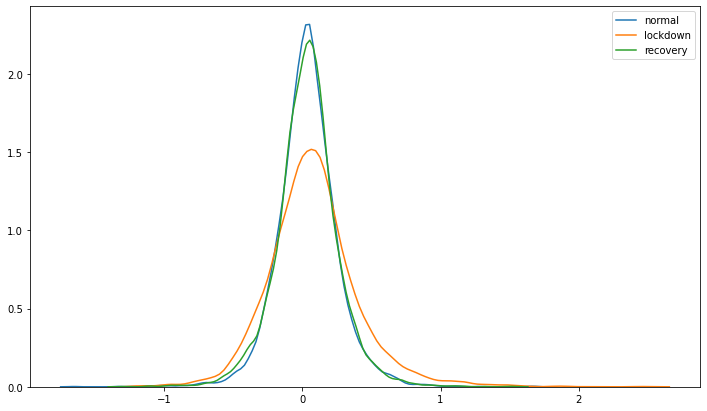

In [172]:
plt.figure(figsize=(12,7))
# sns.distplot(d_youth['01']);
# sns.kdeplot(d_youth['02']);
sns.kdeplot(d_youth['03']);
sns.kdeplot(d_youth['05']);
# sns.distplot(d_youth['06']);
sns.kdeplot(d_youth['07']);
plt.legend(['normal','lockdown','recovery'])

In [174]:
df_model.geometry

0         POINT (4199233.619 7477379.704)
1         POINT (4199233.619 7477379.704)
2         POINT (4199233.619 7477379.704)
3         POINT (4199233.619 7477379.704)
4         POINT (4199233.619 7477379.704)
                       ...               
112027    POINT (4173018.467 7488218.502)
112028    POINT (4173018.467 7488218.502)
112029    POINT (4173018.467 7488218.502)
112030    POINT (4173018.467 7488218.502)
112031    POINT (4173018.467 7488218.502)
Name: geometry, Length: 112032, dtype: geometry

In [54]:
targ_cols=['Rich men interest 2.4/moscow_log', 'Active youth interest 2.4/moscow']

In [30]:
df_lock=gpd.GeoDataFrame(df_model[df_model['Month']=='2020_05'], geometry='geometry', crs='epsg:3857')
df_norm=gpd.GeoDataFrame(df_model[(df_model['Month'].isin(['2019_05','2019_06','2019_07']))],geometry='geometry', crs='epsg:3857')
df_recovery=gpd.GeoDataFrame(df_model[(df_model['Month'].isin(['2020_07']))],geometry='geometry', crs='epsg:3857')

In [ ]:
def group_gdf(gdf, g_col, cols, r_col,geom_col):
    gdf[gdf[r_col]==1][[geom_col]].join(gdf.groupby(g_col)[cols].mean().reset_index())

In [228]:
list(set(x_cols_rich_gwr+x_cols_youth_gwr))

['intersect',
 'mus_1000',
 'is_living',
 'bus_350',
 'metro_350',
 'CNR',
 'fin_ws',
 'rail_350',
 'mus_350']

In [52]:
x_cols_youth_gwr=['intersect', 'fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350','is_living', 'CNR']
x_cols_rich_gwr=['intersect', 'fin_ws', 'mus_350', 'mus_1000', 'metro_350', 'bus_350','is_living', 'CNR']

In [64]:
df_norm['rank']=df_norm.groupby('HEX GID')['CNR'].rank('first')
df_normal=df_norm.set_index('HEX GID')[df_norm.set_index('HEX GID')['rank']==1][['geometry','hex_buffer','Rich men interest 2.4']+list(set(x_cols_rich_gwr+x_cols_youth_gwr))].join(df_norm.groupby('HEX GID')[targ_cols].mean())

In [199]:
def get_xy_bw(df, x_cols, target):
    X=df[x_cols].copy()
    scaler = StandardScaler()
    (scaler.fit(X))
    X=scaler.transform(X)
    
    y=df[target].values.reshape((-1, 1))
    print('start bw')
    selector = mgwr.sel_bw.Sel_BW(coords, y, X, kernel='bisquare', fixed=False )
    #Default golden section search using AICc criterion
    bw = selector.search()
    print('bw=',bw)
    return X,y,bw

In [284]:
X_norm_youth, y_norm_youth, bw_norm_youth=get_xy_bw(df_normal, x_cols_youth_gwr,'Active youth interest 2.4/moscow')

start bw
bw= 64.0


In [412]:
x_cols_youth_gwr

['intersect',
 'fin_ws',
 'mus_350',
 'mus_1000',
 'rail_350',
 'metro_350',
 'is_living',
 'CNR']

In [285]:
X_norm_rich, y_norm_rich, bw_norm_rich=get_xy_bw(df_normal, x_cols_rich_gwr,'Rich men interest 2.4/moscow_log')

start bw
bw= 151.0


In [206]:
X_lock_youth, y_lock_youth, bw_lock_youth=get_xy_bw(df_lock, x_cols_youth_gwr,'Active youth interest 2.4/moscow')

start bw
bw= 85.0


In [207]:
X_lock_rich, y_lock_rich, bw_lock_rich=get_xy_bw(df_lock, x_cols_rich_gwr,'Rich men interest 2.4/moscow_log')

start bw
bw= 154.0


In [245]:
X_rec_youth, y_rec_youth, bw_rec_youth=get_xy_bw(df_recovery, x_cols_youth_gwr,'Active youth interest 2.4/moscow')

start bw
bw= 85.0


In [246]:
X_rec_rich, y_rec_rich, bw_rec_rich=get_xy_bw(df_recovery, x_cols_rich_gwr,'Rich men interest 2.4/moscow_log')

start bw
bw= 157.0


In [247]:
coords=[ (x,y) for x,y in zip(df_recovery.geometry.x,df_recovery.geometry.y)] #неважно какой датасет

In [286]:
gwr_norm_youth = mgwr.gwr.GWR(coords, y_norm_youth, X_norm_youth, bw_norm_youth)
gwr_norm_youth_results = gwr_norm_youth.fit()
print(gwr_norm_youth_results.summary())


Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            242.193
Log-likelihood:                                                    1842.713
AIC:                                                              -3667.427
AICc:                                                             -3665.395
BIC:                                                             -61673.487
R2:                                                                   0.388
Adj. R2:                                                              0.388

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [249]:
gwr_lock_youth = mgwr.gwr.GWR(coords, y_lock_youth, X_lock_youth, bw_lock_youth)
gwr_lock_youth_results = gwr_lock_youth .fit()
print(gwr_lock_youth_results.summary())


Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1055.748
Log-likelihood:                                                   -3311.705
AIC:                                                               6641.409
AICc:                                                              6643.441
BIC:                                                             -60859.932
R2:                                                                   0.309
Adj. R2:                                                              0.308

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [265]:
gwr_rec_youth = mgwr.gwr.GWR(coords, y_rec_youth, X_rec_youth, bw_rec_youth)
gwr_rec_youth_results = gwr_rec_youth.fit()
print(gwr_rec_youth_results.summary())


Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            521.912
Log-likelihood:                                                    -845.230
AIC:                                                               1708.460
AICc:                                                              1710.492
BIC:                                                             -61393.768
R2:                                                                   0.323
Adj. R2:                                                              0.322

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [287]:
gwr_norm_rich = mgwr.gwr.GWR(coords, y_norm_rich, X_norm_rich, bw_norm_rich)
gwr_norm_rich_results = gwr_norm_rich.fit()
print(gwr_norm_rich_results.summary())


Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           1602.309
Log-likelihood:                                                   -4772.307
AIC:                                                               9562.614
AICc:                                                              9564.646
BIC:                                                             -60313.371
R2:                                                                   0.262
Adj. R2:                                                              0.261

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [251]:
gwr_lock_rich = mgwr.gwr.GWR(coords, y_lock_rich, X_lock_rich, bw_lock_rich)
gwr_lock_rich_results = gwr_lock_rich.fit()
print(gwr_lock_rich_results.summary())


Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           5086.852
Log-likelihood:                                                   -8816.709
AIC:                                                              17651.419
AICc:                                                             17653.450
BIC:                                                             -56828.829
R2:                                                                   0.193
Adj. R2:                                                              0.192

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [252]:
gwr_rec_rich = mgwr.gwr.GWR(coords, y_rec_rich, X_rec_rich, bw_rec_rich)
gwr_rec_rich_results = gwr_rec_rich.fit()
print(gwr_rec_rich_results.summary())

Model type                                                         Gaussian
Number of observations:                                                7002
Number of covariates:                                                     9

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           2688.486
Log-likelihood:                                                   -6584.189
AIC:                                                              13186.378
AICc:                                                             13188.409
BIC:                                                             -59227.194
R2:                                                                   0.219
Adj. R2:                                                              0.218

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [295]:
def get_t_v (results, cols, col_name, df):
    x_cols_gwr1=['constant']+cols
    filt_estimates=results.filter_tvals(alpha=0.05)
    df_t_v=pd.DataFrame(filt_estimates)
    df_t_v.columns=['t_v_'+i+col_name for i in x_cols_gwr1 ]
    print ( df_t_v.columns)
    df.drop([i for i in df.columns if i in df_t_v.columns], axis=1, inplace=True)
#     print(df.isnull().sum())
    return filt_estimates, df.join(df_t_v)

In [17]:
# df_spring['local_r2_youth']=gwr_youth_results.localR2

# df_spring['local_r2_rich']=gwr_rich_results.localR2

# df_spring.drop(['local_r2_cor_youth','local_r2_cor_rich'], axis=1, inplace=True)

# df_corona['local_r2_cor_youth']=gwr_youth_cor_results.localR2
# df_corona['local_r2_cor_rich']=gwr_rich_cor_results.localR2

# df_spring.reset_index(inplace=True)
# df_corona.reset_index(inplace=True)

# df_spring.geometry

In [422]:
df_normal.columns

Index(['index', 'HEX GID', 'geometry', 'intersect', 'mus_1000', 'is_living',
       'bus_350', 'metro_350', 'CNR', 'fin_ws', 'rail_350', 'mus_350',
       'Rich men interest 2.4/moscow_log', 'Active youth interest 2.4/moscow',
       't_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth',
       't_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich',
       'is_city_center'],
      dtype='object')

In [394]:
filt_norm_youth.shape

(7002, 9)

### сохраняем коэффициенты gwr в датасеты

In [290]:
filt_norm_youth, df_normal=get_t_v (gwr_norm_youth_results, x_cols_youth_gwr, '_youth', df_normal)
filt_lock_youth, df_lock=get_t_v (gwr_lock_youth_results, x_cols_youth_gwr, '_youth', df_lock)
filt_rec_youth, df_recovery=get_t_v (gwr_rec_youth_results, x_cols_youth_gwr, '_youth', df_recovery)

Index(['t_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth'],
      dtype='object')
Index(['t_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth'],
      dtype='object')
Index(['t_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth'],
      dtype='object')


In [296]:
filt_norm_rich, df_normal=get_t_v (gwr_norm_rich_results, x_cols_rich_gwr, '_rich', df_normal)
filt_lock_rich, df_lock=get_t_v (gwr_lock_rich_results, x_cols_rich_gwr, '_rich', df_lock)
filt_rec_rich, df_recovery=get_t_v (gwr_rec_rich_results, x_cols_rich_gwr, '_rich', df_recovery)

Index(['t_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich'],
      dtype='object')
Index(['t_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich'],
      dtype='object')
Index(['t_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich'],
      dtype='object')


### consider museums

In [319]:
df_normal.groupby(['is_living'])['mus_350'].mean()

is_living
0    0.077144
1    0.009795
Name: mus_350, dtype: float64

In [320]:
red_square_coords = (55.754356, 37.620173)

In [3]:
from functools import partial
import pyproj
from shapely.ops import transform
from shapely.geometry import Point

proj_wgs84 = pyproj.Proj('+proj=longlat +datum=WGS84')


def geodesic_point_buffer(lat, lon, km):
    # Azimuthal equidistant projection
    aeqd_proj = '+proj=aeqd +lat_0={lat} +lon_0={lon} +x_0=0 +y_0=0'
    project = partial(
        pyproj.transform,
        pyproj.Proj(aeqd_proj.format(lat=lat, lon=lon)),
        proj_wgs84)
    buf = Point(0, 0).buffer(km * 1000)  # distance in metres
    return transform(project, buf)

# Example
city_center_polygon= geodesic_point_buffer(55.754356, 37.620173, 5)

In [355]:
df_normal['is_city_center']=df_normal.to_crs('epsg:4326').geometry.within(city_center_polygon)

In [356]:
df_lock['is_city_center']=df_lock.to_crs('epsg:4326').geometry.within(city_center_polygon)
df_recovery['is_city_center']=df_recovery.to_crs('epsg:4326').geometry.within(city_center_polygon)

In [311]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_normal[df_normal['mus_1000']>0][i].apply(lambda x:0 if x==0 else x/abs(x)).value_counts()/df_normal[df_normal['mus_1000']>0].shape[0])


 0.0    0.966015
-1.0    0.023789
 1.0    0.010195
Name: t_v_mus_350_youth, dtype: float64
 0.0    0.868309
 1.0    0.072218
-1.0    0.059473
Name: t_v_mus_1000_youth, dtype: float64
0.0    0.994053
1.0    0.005947
Name: t_v_mus_350_rich, dtype: float64
 0.0    0.957519
 1.0    0.021240
-1.0    0.021240
Name: t_v_mus_1000_rich, dtype: float64


In [357]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_normal[df_normal['mus_1000']>0].groupby(['is_city_center',df_normal[i].apply(lambda x:0 if x==0 else x/abs(x))]).size()/df_normal[df_normal['mus_1000']>0].groupby('is_city_center').size())


is_city_center  t_v_mus_350_youth
False           -1.0                 0.040404
                 0.0                 0.945166
                 1.0                 0.014430
True             0.0                 0.995868
                 1.0                 0.004132
dtype: float64
is_city_center  t_v_mus_1000_youth
False           -1.0                  0.056277
                 0.0                  0.844156
                 1.0                  0.099567
True            -1.0                  0.064050
                 0.0                  0.902893
                 1.0                  0.033058
dtype: float64
is_city_center  t_v_mus_350_rich
False           0.0                 0.989899
                1.0                 0.010101
True            0.0                 1.000000
dtype: float64
is_city_center  t_v_mus_1000_rich
False           -1.0                 0.036075
                 0.0                 0.939394
                 1.0                 0.024531
True             0.0              

In [308]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_lock[df_lock['mus_1000']>0][i].apply(lambda x:0 if x==0 else x/abs(x)).value_counts()/df_lock[df_lock['mus_1000']>0].shape[0])
   

 0.0    0.886151
-1.0    0.069669
 1.0    0.044180
Name: t_v_mus_350_youth, dtype: float64
 0.0    0.751912
-1.0    0.159728
 1.0    0.088360
Name: t_v_mus_1000_youth, dtype: float64
 0.0    0.950722
-1.0    0.038233
 1.0    0.011045
Name: t_v_mus_350_rich, dtype: float64
 0.0    0.928632
-1.0    0.045879
 1.0    0.025489
Name: t_v_mus_1000_rich, dtype: float64


In [358]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_lock[df_lock['mus_1000']>0].groupby(['is_city_center',df_lock[i].apply(lambda x:0 if x==0 else x/abs(x))]).size()/df_lock[df_lock['mus_1000']>0].groupby('is_city_center').size())


is_city_center  t_v_mus_350_youth
False           -1.0                 0.063492
                 0.0                 0.890332
                 1.0                 0.046176
True            -1.0                 0.078512
                 0.0                 0.880165
                 1.0                 0.041322
dtype: float64
is_city_center  t_v_mus_1000_youth
False           -1.0                  0.109668
                 0.0                  0.795094
                 1.0                  0.095238
True            -1.0                  0.231405
                 0.0                  0.690083
                 1.0                  0.078512
dtype: float64
is_city_center  t_v_mus_350_rich
False           -1.0                0.064935
                 0.0                0.916306
                 1.0                0.018759
True             0.0                1.000000
dtype: float64
is_city_center  t_v_mus_1000_rich
False           -1.0                 0.076479
                 0.0               

In [313]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_recovery[df_recovery['mus_1000']>0][i].apply(lambda x:0 if x==0 else x/abs(x)).value_counts()/df_recovery[df_recovery['mus_1000']>0].shape[0])
   

 0.0    0.967715
-1.0    0.018692
 1.0    0.013594
Name: t_v_mus_350_youth, dtype: float64
 0.0    0.793543
 1.0    0.124044
-1.0    0.082413
Name: t_v_mus_1000_youth, dtype: float64
 0.0    0.987256
-1.0    0.011045
 1.0    0.001699
Name: t_v_mus_350_rich, dtype: float64
 0.0    0.906542
 1.0    0.054376
-1.0    0.039082
Name: t_v_mus_1000_rich, dtype: float64


In [359]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth','t_v_mus_350_rich', 't_v_mus_1000_rich']:
    print(df_recovery[df_recovery['mus_1000']>0].groupby(['is_city_center',df_recovery[i].apply(lambda x:0 if x==0 else x/abs(x))]).size()/df_recovery[df_recovery['mus_1000']>0].groupby('is_city_center').size())


is_city_center  t_v_mus_350_youth
False           -1.0                 0.031746
                 0.0                 0.945166
                 1.0                 0.023088
True             0.0                 1.000000
dtype: float64
is_city_center  t_v_mus_1000_youth
False           -1.0                  0.105339
                 0.0                  0.746032
                 1.0                  0.148629
True            -1.0                  0.049587
                 0.0                  0.861570
                 1.0                  0.088843
dtype: float64
is_city_center  t_v_mus_350_rich
False           -1.0                0.018759
                 0.0                0.978355
                 1.0                0.002886
True             0.0                1.000000
dtype: float64
is_city_center  t_v_mus_1000_rich
False           -1.0                 0.059163
                 0.0                 0.875902
                 1.0                 0.064935
True            -1.0               

In [361]:
df_normal.groupby('is_city_center')['mus_350'].sum()

is_city_center
False    106.0
True     221.0
Name: mus_350, dtype: float64

In [270]:
for i in ['t_v_mus_350_youth', 't_v_mus_1000_youth']:
    print(df_lock[i].apply(lambda x:0 if x==0 else x/abs(x)).value_counts()/df_lock.shape[0])
   

 0.0    0.045416
-1.0    0.012425
 1.0    0.004570
Name: t_v_mus_350_youth, dtype: float64
 0.0    0.043987
-1.0    0.010426
 1.0    0.007998
Name: t_v_mus_1000_youth, dtype: float64


In [404]:
df_normal.columns

Index(['index', 'HEX GID', 'geometry', 'intersect', 'mus_1000', 'is_living',
       'bus_350', 'metro_350', 'CNR', 'fin_ws', 'rail_350', 'mus_350',
       'Rich men interest 2.4/moscow_log', 'Active youth interest 2.4/moscow',
       't_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth',
       't_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich',
       'is_city_center'],
      dtype='object')

In [467]:
mkad_original=([55.78000432402266,37.84172564285271],[55.775874525970494,37.8381207618713],[55.775626746008065,37.83979446823122],[55.77446586811748,37.84243326983639],[55.771974101091104,37.84262672750849],[55.77114545193181,37.84153238623039],[55.76722010265554,37.841124690460184],[55.76654891107098,37.84239076983644],[55.76258709833121,37.842283558197025],[55.758073999993734,37.8421759312134],[55.75381499999371,37.84198330422974],[55.749277102484484,37.8416827275085],[55.74794544108413,37.84157576190186],[55.74525257875241,37.83897929098507],[55.74404373042019,37.83739676451868],[55.74298009816793,37.838732481460525],[55.743060321833575,37.841183997352545],[55.73938799999373,37.84097476190185],[55.73570799999372,37.84048155819702],[55.73228210777237,37.840095812164286],[55.73080491981639,37.83983814285274],[55.729799917464675,37.83846476321406],[55.72919751082619,37.83835745269769],[55.72859509486539,37.838636380279524],[55.727705075632784,37.8395161005249],[55.722727886185154,37.83897964285276],[55.72034817326636,37.83862557539366],[55.71944437307499,37.83559735744853],[55.71831419154461,37.835370708803126],[55.71765218986692,37.83738169402022],[55.71691750159089,37.83823396494291],[55.71547311301385,37.838056931213345],[55.71221445615604,37.836812846557606],[55.709331054395555,37.83522525396725],[55.70953687463627,37.83269301586908],[55.70903403789297,37.829667367706236],[55.70552351822608,37.83311126588435],[55.70041317726053,37.83058993121339],[55.69883771404813,37.82983872750851],[55.69718947487017,37.82934501586913],[55.69504441658371,37.828926414016685],[55.69287499999378,37.82876530422971],[55.690759754047335,37.82894754100031],[55.68951421135665,37.827697554878185],[55.68965045405069,37.82447346292115],[55.68322046195302,37.83136543914793],[55.67814012759211,37.833554015869154],[55.67295011628339,37.83544184655761],[55.6672498719639,37.837480388885474],[55.66316274139358,37.838960677246064],[55.66046999999383,37.83926093121332],[55.65869897264431,37.839025050262435],[55.65794084879904,37.83670784390257],[55.65694309303843,37.835656529083245],[55.65689306460552,37.83704060449217],[55.65550363526252,37.83696819873806],[55.65487847246661,37.83760389616388],[55.65356745541324,37.83687972750851],[55.65155951234079,37.83515216004943],[55.64979413590619,37.83312418518067],[55.64640836412121,37.82801726983639],[55.64164525405531,37.820614174591],[55.6421883258084,37.818908190475426],[55.64112490388471,37.81717543386075],[55.63916106913107,37.81690987037274],[55.637925371757085,37.815099354492155],[55.633798276884455,37.808769150787356],[55.62873670012244,37.80100123544311],[55.62554336109055,37.79598013491824],[55.62033499605651,37.78634567724606],[55.618768681480326,37.78334147619623],[55.619855533402706,37.77746201055901],[55.61909966711279,37.77527329626457],[55.618770300976294,37.77801986242668],[55.617257701952106,37.778212973541216],[55.61574504433011,37.77784818518065],[55.61148576294007,37.77016867724609],[55.60599579539028,37.760191219573976],[55.60227892751446,37.75338926983641],[55.59920577639331,37.746329965606634],[55.59631430313617,37.73939925396728],[55.5935318803559,37.73273665739439],[55.59350760316188,37.7299954450912],[55.59469840523759,37.7268679946899],[55.59229549697373,37.72626726983634],[55.59081598950582,37.7262673598022],[55.5877595845419,37.71897193121335],[55.58393177431724,37.70871550793456],[55.580917323756644,37.700497489410374],[55.57778089778455,37.69204305026244],[55.57815154690915,37.68544477378839],[55.57472945079756,37.68391050793454],[55.57328235936491,37.678803592590306],[55.57255251445782,37.6743402539673],[55.57216388774464,37.66813862698363],[55.57505691895805,37.617927457672096],[55.5757737568051,37.60443099999999],[55.57749105910326,37.599683515869145],[55.57796291823627,37.59754177842709],[55.57906686095235,37.59625834786988],[55.57746616444403,37.59501783265684],[55.57671634534502,37.593090671936025],[55.577944600233785,37.587018007904],[55.57982895000019,37.578692203704804],[55.58116294118248,37.57327546607398],[55.581550362779,37.57385012109279],[55.5820107079112,37.57399562266922],[55.58226289171689,37.5735356072979],[55.582393529795155,37.57290393054962],[55.581919415056234,37.57037722355653],[55.584471614867844,37.5592298306885],[55.58867650795186,37.54189249206543],[55.59158133551745,37.5297256269836],[55.59443656218868,37.517837865081766],[55.59635625174229,37.51200186508174],[55.59907823904434,37.506808949737554],[55.6062944994944,37.49820432275389],[55.60967103463367,37.494406071441674],[55.61066689753365,37.494760001358024],[55.61220931698269,37.49397137107085],[55.613417718449064,37.49016528606031],[55.61530616333343,37.48773249206542],[55.622640129112334,37.47921386508177],[55.62993723476164,37.470652153442394],[55.6368075123157,37.46273446298218],[55.64068225239439,37.46350692265317],[55.640794546982576,37.46050283203121],[55.64118904154646,37.457627470916734],[55.64690488145138,37.450718034393326],[55.65397824729769,37.44239252645875],[55.66053543155961,37.434587576721185],[55.661693766520735,37.43582144975277],[55.662755031737014,37.43576786245721],[55.664610641628116,37.430982915344174],[55.66778515273695,37.428547447097685],[55.668633314343566,37.42945134592044],[55.66948145750025,37.42859571562949],[55.670813882451405,37.4262836402282],[55.6811141674414,37.418709037048295],[55.68235377885389,37.41922139651101],[55.68359335082235,37.419218771842885],[55.684375235224735,37.417196501327446],[55.68540557585352,37.41607020370478],[55.68686637150793,37.415640857147146],[55.68903015131686,37.414632153442334],[55.690896881757396,37.413344899475064],[55.69264232162232,37.41171432275391],[55.69455101638112,37.40948282275393],[55.69638690385348,37.40703674603271],[55.70451821283731,37.39607169577025],[55.70942491932811,37.38952706878662],[55.71149057784176,37.387778313491815],[55.71419814298992,37.39049275399779],[55.7155489617061,37.385557272491454],[55.71849856042102,37.38388335714726],[55.7292763261685,37.378368238098155],[55.730845879211614,37.37763597123337],[55.73167906388319,37.37890062088197],[55.734703664681774,37.37750451918789],[55.734851959522246,37.375610832015965],[55.74105626086403,37.3723813571472],[55.746115620904355,37.37014935714723],[55.750883999993725,37.36944173016362],[55.76335905525834,37.36975304365541],[55.76432079697595,37.37244070571134],[55.76636979670426,37.3724259757175],[55.76735417953104,37.369922155757884],[55.76823419316575,37.369892695770275],[55.782312184391266,37.370214730163575],[55.78436801120489,37.370493611114505],[55.78596427165359,37.37120164550783],[55.7874378183096,37.37284851456452],[55.7886695054807,37.37608325135799],[55.78947647305964,37.3764587460632],[55.79146512926804,37.37530000265506],[55.79899647809345,37.38235915344241],[55.80113596939471,37.384344043655396],[55.80322699999366,37.38594269577028],[55.804919036911976,37.38711208598329],[55.806610999993666,37.3880239841309],[55.81001864976979,37.38928977249147],[55.81348641242801,37.39038389947512],[55.81983538336746,37.39235781481933],[55.82417822811877,37.393709457672124],[55.82792275755836,37.394685720901464],[55.830447148154136,37.39557615344238],[55.83167107969975,37.39844478226658],[55.83151823557964,37.40019761214057],[55.83264967594742,37.400398790382326],[55.83322180909622,37.39659544313046],[55.83402792148566,37.39667059524539],[55.83638877400216,37.39682089947515],[55.83861656112751,37.39643489154053],[55.84072348043264,37.3955338994751],[55.84502158126453,37.392680272491454],[55.84659117913199,37.39241188227847],[55.84816071336481,37.392529730163616],[55.85288092980303,37.39486835714723],[55.859893456073635,37.39873052645878],[55.86441833633205,37.40272161111449],[55.867579567544375,37.40697072750854],[55.868369880337,37.410007082016016],[55.86920843741314,37.4120992989502],[55.87055369615854,37.412668021163924],[55.87170587948249,37.41482461111453],[55.873183961039565,37.41862266137694],[55.874879126654704,37.42413732540892],[55.875614937236705,37.4312182698669],[55.8762723478417,37.43111093783558],[55.87706546369396,37.43332105622856],[55.87790681284802,37.43385747619623],[55.88027084462084,37.441303050262405],[55.87942070143253,37.44747234260555],[55.88072960917233,37.44716141796871],[55.88121221323979,37.44769797085568],[55.882080694420715,37.45204320500181],[55.882346110794586,37.45673176190186],[55.88252729504517,37.463383999999984],[55.88294937719063,37.46682797486874],[55.88361266759345,37.470014457672086],[55.88546991372396,37.47751410450743],[55.88534929207307,37.47860317658232],[55.882563306475106,37.48165826025772],[55.8815803226785,37.48316434442331],[55.882427612793315,37.483831555817645],[55.88372791409729,37.483182967125686],[55.88495581062434,37.483092277908824],[55.8875561994203,37.4855716508179],[55.887827444039566,37.486440636245746],[55.88897899871799,37.49014203439328],[55.890208937135604,37.493210285705544],[55.891342397444696,37.497512451065035],[55.89174030252967,37.49780744510645],[55.89239745507079,37.49940333499519],[55.89339220941865,37.50018383334346],[55.903869074155224,37.52421672750851],[55.90564076517974,37.52977457672118],[55.90661661218259,37.53503220370484],[55.90714113744566,37.54042858064267],
                                                                    [55.905645048442985,37.54320461007303],[55.906608607018505,37.545686966066306],[55.90788552162358,37.54743976120755],[55.90901557907218,37.55796999999999],[55.91059395704873,37.572711542327866],[55.91073854155573,37.57942799999998],[55.91009969268444,37.58502865872187],[55.90794809960554,37.58739968913264],[55.908713267595054,37.59131567193598],[55.902866854295375,37.612687423278814],[55.90041967242986,37.62348079629517],[55.898141151686396,37.635797880950896],[55.89639275532968,37.649487626983664],[55.89572360207488,37.65619302513125],[55.895295577183965,37.66294133862307],[55.89505457604897,37.66874564418033],[55.89254677027454,37.67375601586915],[55.8947775867987,37.67744661901856],[55.89450045676125,37.688347],[55.89422926332761,37.69480554232789],[55.89322256101114,37.70107096560668],[55.891763491662616,37.705962965606716],[55.889110234998974,37.711885134918205],[55.886577568759876,37.71682005026245],[55.88458159806678,37.7199315476074],[55.882281005794134,37.72234560316464],[55.8809452036196,37.72364385977171],[55.8809722706006,37.725371142837474],[55.88037213862385,37.727870902099546],[55.877941504088696,37.73394330422971],[55.87208120378722,37.745339592590376],[55.86703807949492,37.75525267724611],[55.859821640197474,37.76919976190188],[55.82962968399116,37.827835219574],[55.82575289922351,37.83341438888553],[55.82188784027888,37.83652584655761],[55.81612575504693,37.83809213491821],[55.81460347077685,37.83605359521481],[55.81276696067908,37.83632178569025],[55.811486181656385,37.838623105812026],[55.807329380532785,37.83912198147584],[55.80510270463816,37.839079078033414],[55.79940712529036,37.83965844708251],[55.79131399999368,37.840581150787344],[55.78000432402266,37.84172564285271])

new_coords=[ [i,j] for i,j in zip(np.array(mkad_original)[:, 1], np.array(mkad_original)[:, 0])]

mkad=shape({ "type": "Polygon", "crs":"epsg=4326", "coordinates": [new_coords]})

xs, ys = zip(*new_coords)

project = pyproj.Transformer.from_proj(
    pyproj.Proj(init='epsg:4326'), # source coordinate system
    pyproj.Proj(init='epsg:3857')) # destination coordinate system

# g1 is a shapley Polygon

g2 = transform(project.transform, mkad)  # apply projection

xs, ys = zip(*g2.boundary.coords)

plt.plot(xs, ys)

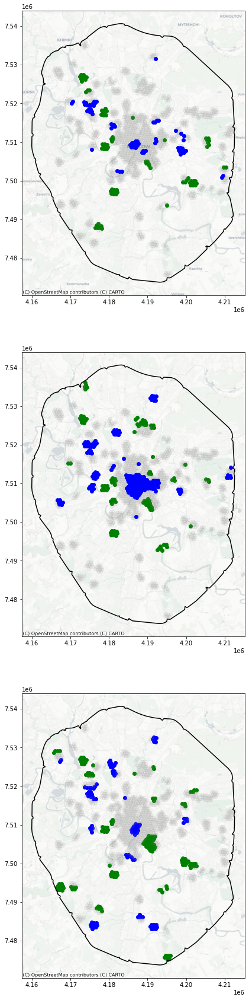

In [488]:
fig,axs=plt.subplots(3,1, figsize=(20,30))
df_normal.query('t_v_mus_1000_youth>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[0])
df_normal.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[0], alpha=0.1)
df_normal.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[0])
axs[0].plot(xs, ys, color='black')
scalebar = AnchoredSizeBar(axs[0].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[0].add_artist(scalebar)
df_lock.query('t_v_mus_1000_youth>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[1])
df_lock.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[1], alpha=0.1)
df_lock.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[1])
axs[1].plot(xs, ys, color='black')
scalebar = AnchoredSizeBar(axs[1].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[1].add_artist(scalebar)
df_recovery.query('t_v_mus_1000_youth>0 and mus_1000 >0' )\
        .plot(color='green', ax=axs[2])
df_recovery.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[2])
df_recovery.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[2], alpha=0.1)
axs[2].plot(xs, ys, color='black')
scalebar = AnchoredSizeBar(axs[2].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[2].add_artist(scalebar)
ctx.add_basemap(axs[0], url=ctx.providers.CartoDB.Positron)
ctx.add_basemap(axs[1], url=ctx.providers.CartoDB.PositronNoLabels)
ctx.add_basemap(axs[2], url=ctx.providers.CartoDB.PositronNoLabels)

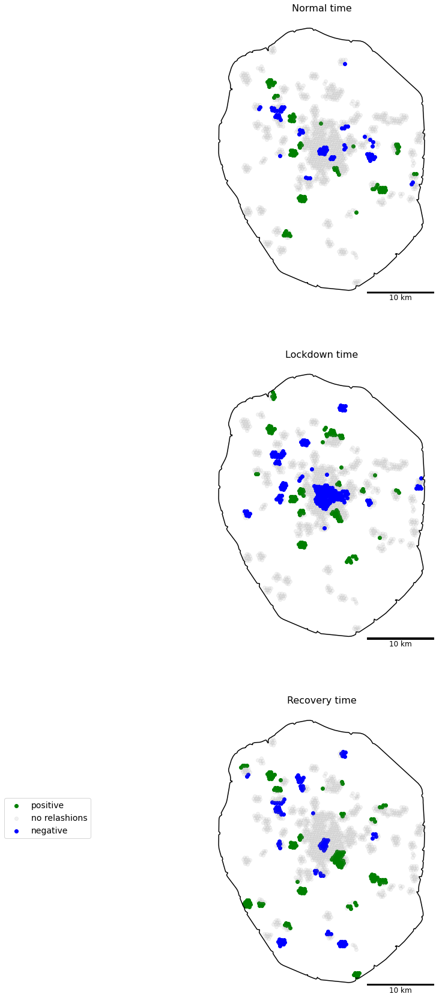

In [517]:
fig,axs=plt.subplots(3,1, figsize=(20,30))
df_normal.query('t_v_mus_1000_youth>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[0])
df_normal.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[0], alpha=0.1)
df_normal.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[0])
# axs[0].legend(['positive','no relashions','negative'])
axs[0].plot(xs, ys, color='black')
axs[0].set_title('Normal time', fontsize=16)
axs[0].axis('off') 
scalebar = AnchoredSizeBar(axs[0].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[0].add_artist(scalebar)
df_lock.query('t_v_mus_1000_youth>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[1])
df_lock.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[1], alpha=0.1)
df_lock.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[1])
axs[1].legend(['positive','no relashions','negative'], loc='upper right', bbox_to_anchor=(-0.5, -0.5), fontsize=14)
axs[1].plot(xs, ys, color='black')
axs[1].set_title('Lockdown time', fontsize=16)
axs[1].axis('off')
scalebar = AnchoredSizeBar(axs[1].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[1].add_artist(scalebar)
df_recovery.query('t_v_mus_1000_youth>0 and mus_1000 >0' )\
        .plot(color='green', ax=axs[2])
df_recovery.query('t_v_mus_1000_youth<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[2])
df_recovery.query('t_v_mus_1000_youth==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[2], alpha=0.1)
# axs[2].legend(['positive','no relashions','negative'])
axs[2].plot(xs, ys, color='black')
axs[2].set_title('Recovery time', fontsize=16)
axs[2].axis('off')
scalebar = AnchoredSizeBar(axs[2].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[2].add_artist(scalebar)
# ctx.add_basemap(axs[0], url=ctx.providers.CartoDB.Positron)
# ctx.add_basemap(axs[1], url=ctx.providers.CartoDB.PositronNoLabels)
# ctx.add_basemap(axs[2], url=ctx.providers.CartoDB.PositronNoLabels)

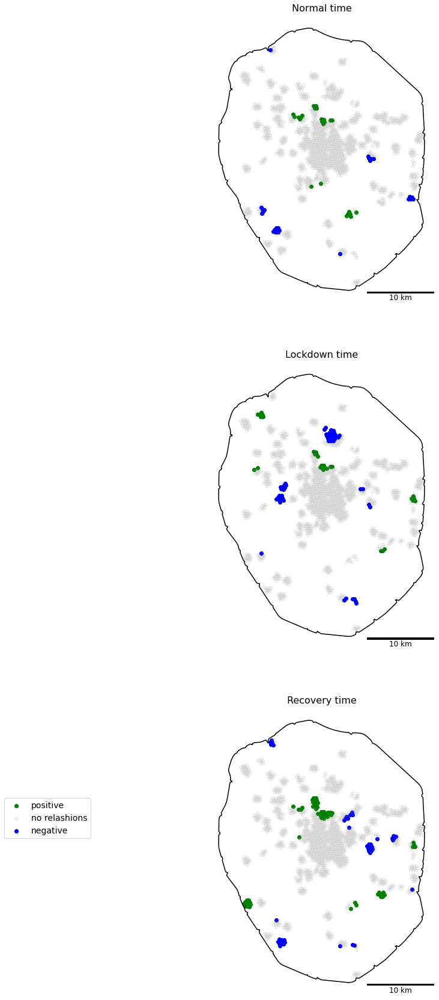

In [518]:
fig,axs=plt.subplots(3,1, figsize=(20,30))
df_normal.query('t_v_mus_1000_rich>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[0])
df_normal.query('t_v_mus_1000_rich==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[0], alpha=0.1)
df_normal.query('t_v_mus_1000_rich<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[0])
# axs[0].legend(['positive','no relashions','negative'])
axs[0].plot(xs, ys, color='black')
axs[0].set_title('Normal time', fontsize=16)
axs[0].axis('off') 
scalebar = AnchoredSizeBar(axs[0].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[0].add_artist(scalebar)
df_lock.query('t_v_mus_1000_rich>0 and mus_1000 >0')\
        .plot(color='green', ax=axs[1])
df_lock.query('t_v_mus_1000_rich==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[1], alpha=0.1)
df_lock.query('t_v_mus_1000_rich<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[1])
axs[1].legend(['positive','no relashions','negative'], loc='upper right', bbox_to_anchor=(-0.5, -0.5), fontsize=14)
axs[1].plot(xs, ys, color='black')
axs[1].set_title('Lockdown time', fontsize=16)
axs[1].axis('off')
scalebar = AnchoredSizeBar(axs[1].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[1].add_artist(scalebar)
df_recovery.query('t_v_mus_1000_rich>0 and mus_1000 >0' )\
        .plot(color='green', ax=axs[2])
df_recovery.query('t_v_mus_1000_rich<0 and mus_1000 >0')\
        .plot(color='blue', ax=axs[2])
df_recovery.query('t_v_mus_1000_rich==0 and mus_1000 >0')\
        .plot(color='grey', ax=axs[2], alpha=0.1)
# axs[2].legend(['positive','no relashions','negative'])
axs[2].plot(xs, ys, color='black')
axs[2].set_title('Recovery time', fontsize=16)
axs[2].axis('off')
scalebar = AnchoredSizeBar(axs[2].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[2].add_artist(scalebar)

In [561]:
df_normal.merge(gdf_mus1000, on='HEX GID').query('t_v_mus_1000_youth<0 and is_city_center==False')['fin_ws'].mean()

70.48868689903846

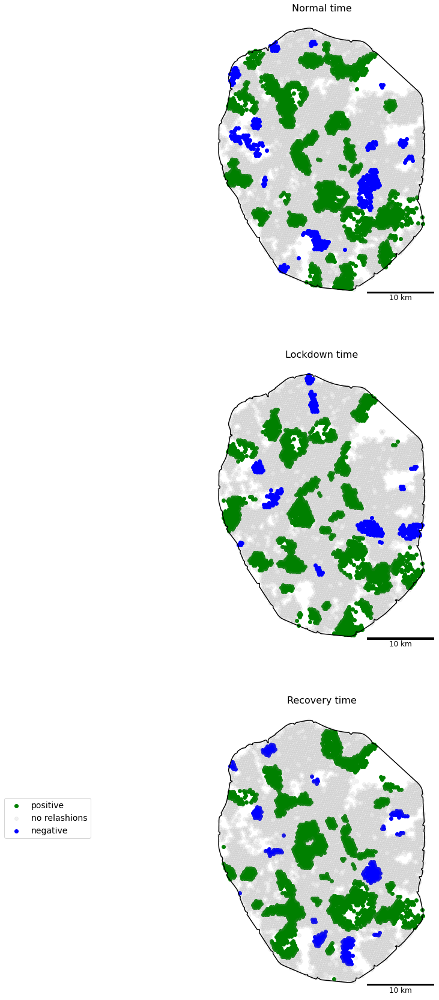

In [567]:
fig,axs=plt.subplots(3,1, figsize=(20,30))
df_normal.query('t_v_fin_ws_rich>0 and fin_ws >0')\
        .plot(color='green', ax=axs[0])
df_normal.query('t_v_fin_ws_rich==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[0], alpha=0.1)
df_normal.query('t_v_fin_ws_rich<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[0])
# axs[0].legend(['positive','no relashions','negative'])
axs[0].plot(xs, ys, color='black')
axs[0].set_title('Normal time', fontsize=16)
axs[0].axis('off') 
scalebar = AnchoredSizeBar(axs[0].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[0].add_artist(scalebar)
df_lock.query('t_v_fin_ws_rich>0 and fin_ws >0')\
        .plot(color='green', ax=axs[1])
df_lock.query('t_v_fin_ws_rich==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[1], alpha=0.1)
df_lock.query('t_v_fin_ws_rich<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[1])
axs[1].legend(['positive','no relashions','negative'], loc='upper right', bbox_to_anchor=(-0.5, -0.5), fontsize=14)
axs[1].plot(xs, ys, color='black')
axs[1].set_title('Lockdown time', fontsize=16)
axs[1].axis('off')
scalebar = AnchoredSizeBar(axs[1].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[1].add_artist(scalebar)
df_recovery.query('t_v_fin_ws_rich>0 and fin_ws >0' )\
        .plot(color='green', ax=axs[2])
df_recovery.query('t_v_fin_ws_rich<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[2])
df_recovery.query('t_v_fin_ws_rich==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[2], alpha=0.1)
# axs[2].legend(['positive','no relashions','negative'])
axs[2].plot(xs, ys, color='black')
axs[2].set_title('Recovery time', fontsize=16)
axs[2].axis('off')
scalebar = AnchoredSizeBar(axs[2].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[2].add_artist(scalebar)

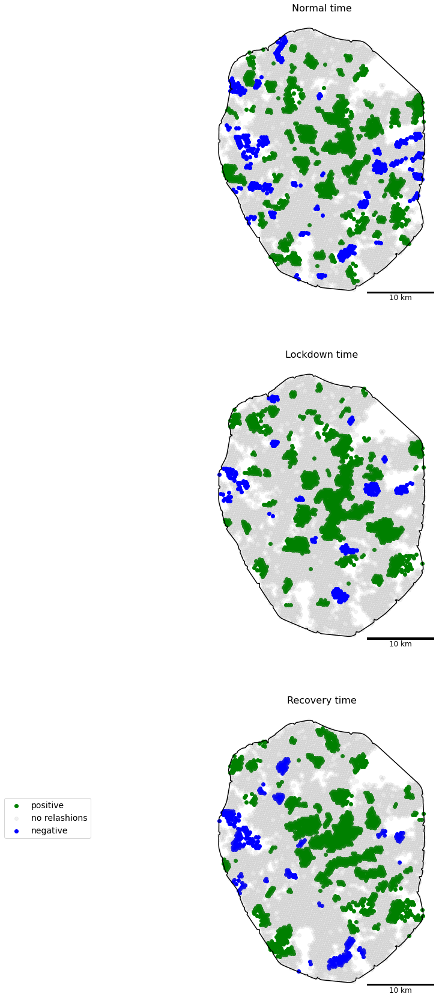

In [568]:
fig,axs=plt.subplots(3,1, figsize=(20,30))
df_normal.query('t_v_fin_ws_youth>0 and fin_ws >0')\
        .plot(color='green', ax=axs[0])
df_normal.query('t_v_fin_ws_youth==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[0], alpha=0.1)
df_normal.query('t_v_fin_ws_youth<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[0])
# axs[0].legend(['positive','no relashions','negative'])
axs[0].plot(xs, ys, color='black')
axs[0].set_title('Normal time', fontsize=16)
axs[0].axis('off') 
scalebar = AnchoredSizeBar(axs[0].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[0].add_artist(scalebar)
df_lock.query('t_v_fin_ws_youth>0 and fin_ws >0')\
        .plot(color='green', ax=axs[1])
df_lock.query('t_v_fin_ws_youth==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[1], alpha=0.1)
df_lock.query('t_v_fin_ws_youth<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[1])
axs[1].legend(['positive','no relashions','negative'], loc='upper right', bbox_to_anchor=(-0.5, -0.5), fontsize=14)
axs[1].plot(xs, ys, color='black')
axs[1].set_title('Lockdown time', fontsize=16)
axs[1].axis('off')
scalebar = AnchoredSizeBar(axs[1].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[1].add_artist(scalebar)
df_recovery.query('t_v_fin_ws_youth>0 and fin_ws >0' )\
        .plot(color='green', ax=axs[2])
df_recovery.query('t_v_fin_ws_youth<0 and fin_ws >0')\
        .plot(color='blue', ax=axs[2])
df_recovery.query('t_v_fin_ws_youth==0 and fin_ws >0')\
        .plot(color='grey', ax=axs[2], alpha=0.1)
# axs[2].legend(['positive','no relashions','negative'])
axs[2].plot(xs, ys, color='black')
axs[2].set_title('Recovery time', fontsize=16)
axs[2].axis('off')
scalebar = AnchoredSizeBar(axs[2].transData,
                       17000, '10 km', 'lower right', 
                       pad=0.1,
                       color='black',
                       frameon=False,
                       size_vertical=400,
                       fontproperties=fontprops)
#     scalebar = ScaleBar(1, units='km') # 1 pixel = 0.2 meter
axs[2].add_artist(scalebar)

In [557]:
df_lock.merge(gdf_mus1000, on='HEX GID').query('t_v_mus_1000_youth<0 and is_city_center==False')['fin_ws_level'].value_counts()

4.Very Walkable            44
3.Somewhat Walkable        23
2.Car-Dependent             7
1.Heavily car-dependent     4
5.Walkers Paradise          2
Name: fin_ws_level, dtype: int64

In [553]:
df_recovery.merge(gdf_mus1000, on='HEX GID').query('t_v_mus_1000_youth<0 and is_city_center==False')['name'].unique()

array(['Мир тайн', 'Палеонтологический музей', 'Музей Великий почин',
       'Картинная галерея Василия Нестеренко',
       'Музей истории индустриализации земледелия Имени В. П. Горячкина',
       'Центральный музей им. Б.В.Зимина Всероссийского общества слепых',
       'Музей истории телефонной связи МГТС', 'Экспериментаниум',
       'Rohini gallery', 'Научно-художественный музей коневодства',
       'Государственный выставочный зал "Ковчег"',
       'Музей экономики и быта', 'Art Future Gallery',
       'Музей "Храм Покрова в Филях"'], dtype=object)

In [570]:
df_recovery.merge(gdf_mus1000, on='HEX GID').query('t_v_mus_1000_rich==0 and is_city_center==True')['name'].value_counts()

Выставочный зал Московского союза художников      20
Музей книги                                       19
Музей пряника                                     17
Центр фотографии им. братьев Люмьер               12
Музей истории телефона                            12
                                                  ..
Тапан                                              5
Центральный музей ФС ВНГ РФ                        5
Фотогалерея "Метро"                                4
Центр профориентации Московского метрополитена     4
Музей Ар Деко                                      2
Name: name, Length: 183, dtype: int64

In [565]:
df_recovery.merge(gdf_mus1000, on='HEX GID').query('t_v_mus_1000_rich>0 and is_city_center==False')['name'].value_counts()

Музей традиционных русских напитков    12
Музей техники Apple                    10
Музей С.А. Есенина                      8
Территория «Люблино»                    8
Музейно-выставочный центр «Дача»        4
Музей истории евреев в России           3
Голландский домик царя Петра I          2
Музей спортивной славы ЦСКА             1
Территория «Коломенское»                1
Name: name, dtype: int64

In [549]:
df_normal.columns

Index(['index', 'HEX GID', 'geometry', 'intersect', 'mus_1000', 'is_living',
       'bus_350', 'metro_350', 'CNR', 'fin_ws', 'rail_350', 'mus_350',
       'Rich men interest 2.4/moscow_log', 'Active youth interest 2.4/moscow',
       't_v_constant_youth', 't_v_intersect_youth', 't_v_fin_ws_youth',
       't_v_mus_350_youth', 't_v_mus_1000_youth', 't_v_rail_350_youth',
       't_v_metro_350_youth', 't_v_is_living_youth', 't_v_CNR_youth',
       't_v_constant_rich', 't_v_intersect_rich', 't_v_fin_ws_rich',
       't_v_mus_350_rich', 't_v_mus_1000_rich', 't_v_metro_350_rich',
       't_v_bus_350_rich', 't_v_is_living_rich', 't_v_CNR_rich',
       'is_city_center', 'hex_buffer1000'],
      dtype='object')

In [489]:
# #Active youth_normal
# f, ax=plt.subplots(1,2, figsize=(15,30),subplot_kw=dict(aspect='equal') )
# ax=ax.flatten()
# i=2
# for c, row in df_normal[df_normal.columns[17:19]].T.iterrows():
    
#     listing_tmp=df_normal.assign(toplot_youth=df_normal[c])
# #     l1=listing_tmp.query('toplot_youth==0')\
# #         .sort_values('toplot_youth')\
# #         .plot(color='grey', marker='.', ax=ax[i], alpha=0.2, label='0')
#     l2=listing_tmp.query('toplot_youth>0')\
#         .sort_values('toplot_youth')\
#         .plot(color='green', marker='.', ax=ax[i-2], label='1')
#     l3=listing_tmp.query('toplot_youth<0')\
#         .sort_values('toplot_youth')\
#         .plot(color='blue', marker='.', ax=ax[i-2], alpha=1, label='-1')
#     ax[i-2].set_title('Sign of '+x_cols_youth_gwr[i]+' across Moscow. Active youth model', fontsize=12)
#     ax[i-2].set_axis_off()
#     i+=1

#     ax[i].set_xticklabels([])
#     ax[i].set_yticklabels([])
#     ax[i].set_xticks([])
#     ax[i].set_yticks([])
# f.tight_layout()
#     ctx.add_basemap(ax[i],url=ST_TONER )

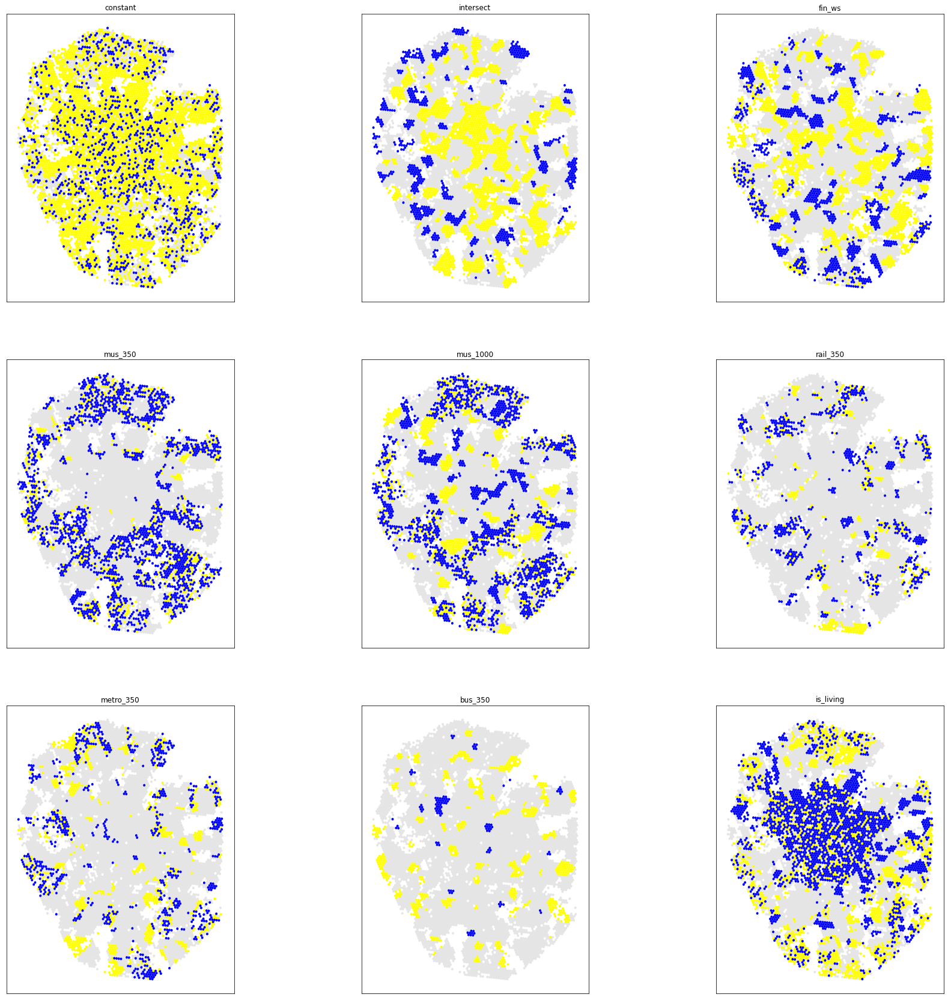

In [403]:
#Act youth normal all
f, ax=plt.subplots(3,3, figsize=(30,30), subplot_kw=dict(aspect='equal'))
ax=ax.flatten()
for i, row in enumerate(filt_estimates.T):
    listing_tmp=df_spring.assign(toplot_youth=filt_sp_youth.T[i])
    listing_tmp.query('toplot_youth==0')\
        .sort_values('toplot_youth')\
        .plot(color='grey', marker='.', ax=ax[i], alpha=0.2)
    listing_tmp.query('toplot_youth>0')\
        .sort_values('toplot_youth')\
        .plot(color='yellow', marker='.', ax=ax[i], legend=True)
    listing_tmp.query('toplot_youth<0')\
        .sort_values('toplot_youth')\
        .plot(color='blue', marker='.', ax=ax[i], legend=True)
    ax[i].set_title(x_cols_gwr1[i], fontsize=12)
    ax[i].set_xticklabels([])
    ax[i].set_yticklabels([])
    ax[i].set_xticks([])
    ax[i].set_yticks([])
# f.tight_layout()
# plt.show()

In [ ]:
f, ax=plt.subplots(3,3, figsize=(30,30), subplot_kw=dict(aspect='equal'))
ax=ax.flatten()
for i, row in enumerate(filt_estimates1.T):
    listing_tmp=df_corona.assign(toplot=filt_estimates1.T[i])
    listing_tmp.query('toplot==0')\
        .sort_values('toplot')\
        .plot(color='grey', marker='.', ax=ax[i], alpha=0.2)
    listing_tmp.query('toplot>0')\
        .sort_values('toplot')\
        .plot(color='yellow', marker='.', ax=ax[i], legend=True)
    listing_tmp.query('toplot<0')\
        .sort_values('toplot')\
        .plot(color='blue', marker='.', ax=ax[i], legend=True)
    ax[i].set_axis_off() 
    ax[i].set_title(x_cols_gwr1[i], fontsize=12)
#     ax[i].set_xticklabels([])
#     ax[i].set_yticklabels([])
#     ax[i].set_xticks([])
#     ax[i].set_yticks([])

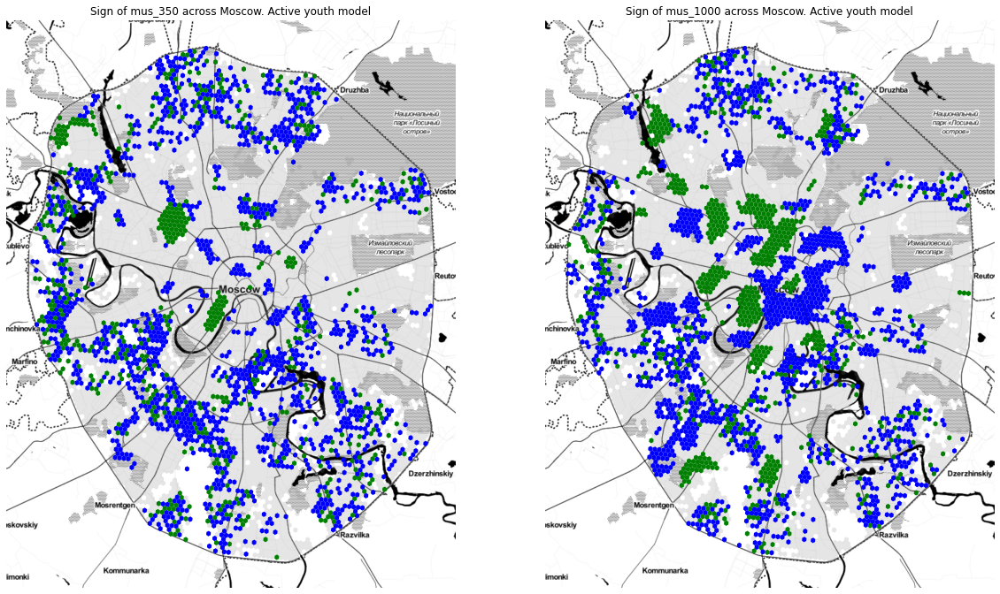

In [399]:
f, ax=plt.subplots(1,2, figsize=(20,30), subplot_kw=dict(aspect='equal'))
ax=ax.flatten()
for i, row in enumerate(filt_estimates1.T[3:5]):
    listing_tmp=df_corona.assign(toplot=filt_estimates1.T[i+3])
    listing_tmp.query('toplot==0')\
        .sort_values('toplot')\
        .plot(color='grey', marker='.', ax=ax[i], alpha=0.2)
    listing_tmp.query('toplot>0')\
        .sort_values('toplot')\
        .plot(color='green', marker='.', ax=ax[i], legend=True)
    listing_tmp.query('toplot<0')\
        .sort_values('toplot')\
        .plot(color='blue', marker='.', ax=ax[i], legend=True)
    ax[i].set_axis_off() 
#     ax[i].set_title(x_cols_gwr1[i+3], fontsize=12)
    
    ax[i].set_title('Sign of '+x_cols_gwr1[i+3]+' across Moscow. Active youth model', fontsize=12)
    ctx.add_basemap(ax[i],url=ST_TONER )
#     ax[i].set_xticklabels([])
#     ax[i].set_yticklabels([])
#     ax[i].set_xticks([])
#     ax[i].set_yticks([])
    

In [74]:

def data2geojson(df, filename):
    import json
    import geojson
    features = []
    insert_features = lambda X: features.append(
            geojson.Feature(geometry=X['hex_buffer'],
                            properties=dict(name=X["HEX GID"])))
    df.apply(insert_features, axis=1)
    with open(filename, 'w', encoding='utf8') as fp:
        geojson.dump(geojson.FeatureCollection(features), fp, sort_keys=True, ensure_ascii=False)

In [100]:
def visual_folium(my_df, target,  name, df_mus):
    print(target)
    df=my_df[['HEX GID','hex_buffer', target]].copy()
    file_name=name+'.geojson'
    data2geojson(df, file_name)
    m = folium.Map([55.7,37.5], zoom_start=9.5)
    print(my_df[target].nunique())
    folium.Choropleth(
        geo_data=file_name,
        name=target,
        data=df,
        columns=['HEX GID',target],
        key_on='feature.properties.name',
        fill_color='YlOrRd',
        fill_opacity=0.5,
        line_opacity=0.3,
        legend_name=name
).add_to(m)
#     col_name=[i for i in df_mus.columns if 'name' in str.lower(i)]
    for i in df_mus.index:
        folium.Marker((float(df_mus.loc[i].geometry.y), float(df_mus.loc[i].geometry.x)), popup=df_mus.loc[i]['name'] ).add_to(m)
    return m 

In [511]:
# df_hex=df_spring.to_crs('epsg:4326')
# name='t_v_mus_1000_youth'
# target='t_v_mus_1000_youth'
# df=df_hex[df_hex['t_v_mus_1000_youth']!=0][['HEX GID','hex_buffer', target]]
# file_name=name+'.geojson'
# data2geojson(df, file_name)

In [512]:
m = folium.Map([55.7,37.5], zoom_start=9.5)

In [461]:
# df_spring=df_spring.set_index('HEX GID').join(df_hex_ws['hex_buffer'])

# df_spring=gpd.GeoDataFrame(df_spring, geometry='hex_buffer', crs='4326')

In [466]:
df_spring.reset_index(inplace=True)

In [35]:
df_spring['geometry_hex']

0       POINT (4199233.619126294 7477379.703508012)
1       POINT (4199581.458576431 7477886.725166725)
2       POINT (4199010.090816448 7477946.392919909)
3       POINT (4198885.831950967 7476872.709151424)
4       POINT (4194516.359375716 7474069.108034957)
                           ...                     
6997    POINT (4173589.633996888 7488160.961056277)
6998     POINT (4173935.67043022 7488669.423541656)
6999    POINT (4172793.255899094 7488784.498185745)
7000    POINT (4173139.248476476 7489293.026111811)
7001     POINT (4173018.46657648 7488218.501669228)
Name: geometry_hex, Length: 7002, dtype: object

In [42]:
df_mus['1km_buffer']=df_mus.geometry.to_crs('epsg:3857').buffer(1000)

In [80]:
ds_youth=df_spring[(df_spring['t_v_mus_1000_youth']!=0)].to_crs('epsg:4326').copy()
ds_youth['t_v_mus_1000_youth']=ds_youth['t_v_mus_1000_youth'].apply(lambda x: 0 if x==0 else x/(abs(x)))

In [6]:
# visual_folium(ds_youth, 't_v_mus_1000_youth', 't_v_mus_350_youth_sp', df_mus)

In [4]:
# dc_youth=df_corona[(df_corona['t_v_mus_1000_youth']!=0)].to_crs('epsg:4326').copy()
# dc_youth['t_v_mus_1000_youth1']=dc_youth['t_v_mus_1000_youth'].apply(lambda x: 0 if x==0 else x/(abs(x)))
# visual_folium(ds_youth, 't_v_mus_1000_youth', 't_v_mus_1000_youth_cor', df_mus)

In [83]:
dс_youth['t_v_mus_1000_youth'].unique()

array([ 1., -1.])

In [126]:
df_model['Active youth interest 2.4/moscow'].mean()

0.8464698834058084

In [104]:
ds_rich=df_spring[(df_spring['t_v_mus_1000_rich']!=0)&(df_spring['mus_1000']>0)].to_crs('epsg:4326').copy()
ds_rich['t_v_mus_1000_rich']=ds_rich['t_v_mus_1000_rich'].apply(lambda x: 0 if x==0 else x/(abs(x)))

In [5]:
# visual_folium(ds_rich, 't_v_mus_1000_rich', 't_v_mus_1000_rich_sp', df_mus)

In [106]:
dc_rich=df_corona[(df_corona['t_v_mus_1000_rich']!=0)&(df_corona['mus_1000']>0)].to_crs('epsg:4326').copy()
dc_rich['t_v_mus_1000_rich']=dc_rich['t_v_mus_1000_rich'].apply(lambda x: 0 if x==0 else x/(abs(x)))

In [545]:
visual_folium(ds_rich, 'Rich men interest/moscow', 't_v_mus_1000_rich', df_mus)

KeyError: "['Rich men interest/moscow'] not in index"

In [448]:
# # df_hex=df_spring
# # name='t_v_mus_1000_youth'
# # target='t_v_mus_1000_youth'

# # df=df_hex[['HEX GID','hex_buffer', target]]
# # print(df.shape, df_target.shape)

# # file_name=name+'.geojson'
# # data2geojson(df, file_name)
# m = folium.Map([55.7,37.5], zoom_start=9.5)
# folium.Choropleth(
#     geo_data=file_name,
#     name=target,
#     data=df[['HEX GID',target]],
#     columns=['HEX GID',target],
#     key_on='feature.properties.name',
#     fill_color='YlOrRd',
#     fill_opacity=0.5,
#     line_opacity=0.3,
#     legend_name=name
# ).add_to(m)

In [ ]:
# идея визуализировать поближе где работает а где нет скор музеев

In [455]:
for i in ['t_v_mus_350_rich', 't_v_mus_1000_rich','t_v_mus_350_youth', 't_v_mus_1000_youth']:
    print(i)
    print(df_corona.groupby(df_corona[i].apply(lambda x: 0 if x==0 else x/abs(x)))['mus_350','mus_1000'].mean())

t_v_mus_350_rich
                   mus_350  mus_1000
t_v_mus_350_rich                    
-1.0              0.030023  0.180139
 0.0              0.054180  0.449022
 1.0              0.001263  0.008838
t_v_mus_1000_rich
                    mus_350  mus_1000
t_v_mus_1000_rich                    
-1.0               0.035608  0.310089
 0.0               0.055314  0.451222
 1.0               0.010486  0.083889
t_v_mus_350_youth
                    mus_350  mus_1000
t_v_mus_350_youth                    
-1.0               0.013431  0.111722
 0.0               0.063207  0.515909
 1.0               0.013216  0.117474
t_v_mus_1000_youth
                     mus_350  mus_1000
t_v_mus_1000_youth                    
-1.0                0.062692  0.496005
 0.0                0.046125  0.379613
 1.0                0.024062  0.217517


In [453]:
(df_corona['mus_1000']>0).mean()

0.16809483004855755

In [451]:
for i in ['t_v_mus_350_rich', 't_v_mus_1000_rich','t_v_mus_350_youth', 't_v_mus_1000_youth']:
    print(i)
#     print()
    print(df_spring.groupby(df_spring[i].apply(lambda x: 0 if x==0 else x/abs(x)))['mus_350','mus_1000'].mean())

t_v_mus_350_rich
                   mus_350  mus_1000
t_v_mus_350_rich                    
-1.0              0.000000  0.010989
 0.0              0.058162  0.475825
 1.0              0.001062  0.007431
t_v_mus_1000_rich
                    mus_350  mus_1000
t_v_mus_1000_rich                    
-1.0               0.027329  0.254658
 0.0               0.057670  0.465206
 1.0               0.005025  0.054271
t_v_mus_350_youth
                    mus_350  mus_1000
t_v_mus_350_youth                    
-1.0               0.003339  0.020590
 0.0               0.070071  0.575155
 1.0               0.005874  0.058737
t_v_mus_1000_youth
                     mus_350  mus_1000
t_v_mus_1000_youth                    
-1.0                0.038664  0.295255
 0.0                0.057787  0.478741
 1.0                0.014451  0.131985


In [479]:
df

,HEX GID,hex_buffer,t_v_mus_1000_youth
0,891181b41a3ffff,"POLYGON ((37.71961 55.59003, 37.72199 55.58897...",0.000000
1,891181b41a7ffff,"POLYGON ((37.72273 55.59260, 37.72511 55.59154...",-2.289603
2,891181b41b7ffff,"POLYGON ((37.71760 55.59290, 37.71998 55.59184...",0.000000
3,891181b41bbffff,"POLYGON ((37.71648 55.58745, 37.71886 55.58639...",0.000000
4,891181b4427ffff,"POLYGON ((37.67723 55.57322, 37.67961 55.57216...",2.882257
...,...,...,...
6997,8911aa7b6cbffff,"POLYGON ((37.48925 55.64471, 37.49163 55.64366...",0.000000
6998,8911aa7b6cfffff,"POLYGON ((37.49236 55.64729, 37.49474 55.64624...",0.000000
6999,8911aa7b6d3ffff,"POLYGON ((37.48209 55.64787, 37.48448 55.64682...",0.000000
7000,8911aa7b6d7ffff,"POLYGON ((37.48520 55.65045, 37.48759 55.64940...",0.000000


In [476]:
m

In [434]:
df_spring.columns

Index(['index', 'HEX GID', 'season', 'Active youth interest 2.4/moscow',
       'Rich men interest 2.4/moscow', 'Non-residents/moscow', 'intersect',
       'fin_ws', 'mus_350', 'mus_1000', 'rail_350', 'metro_350', 'bus_350',
       'season__1', 'season__2', 'season__3', 'season__corona', 'is_living',
       'Non-residents/moscow_log', 'y_fitted_Active youth interest 2.4/moscow',
       'resid_Active youth interest 2.4/moscow',
       'y_fitted_Rich men interest 2.4/moscow',
       'resid_Rich men interest 2.4/moscow',
       'y_fitted_Non-residents/moscow_log', 'resid_Non-residents/moscow_log',
       'geometry_hex', 'local_r2', 'local_r2_youth', 'gwr_resid_youth',
       'local_r2_rich', 'gwr_resid_rich', 'fin_ws_level', 't_v_constant_youth',
       't_v_intersect_youth', 't_v_fin_ws_youth', 't_v_mus_350_youth',
       't_v_mus_1000_youth', 't_v_rail_350_youth', 't_v_metro_350_youth',
       't_v_bus_350_youth', 't_v_is_living_youth', 't_v_constant_reach',
       't_v_constant_rich', 

#### Нужно посчитать что по районам!!

<AxesSubplot:>

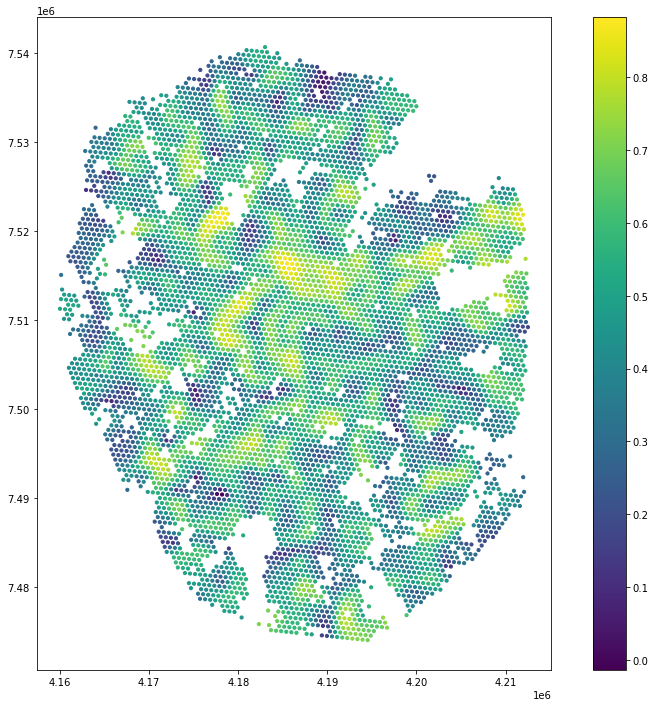

In [418]:
df_spring.plot(column='local_r2_youth', figsize=(15,12), legend=True, markersize=10)

<AxesSubplot:>

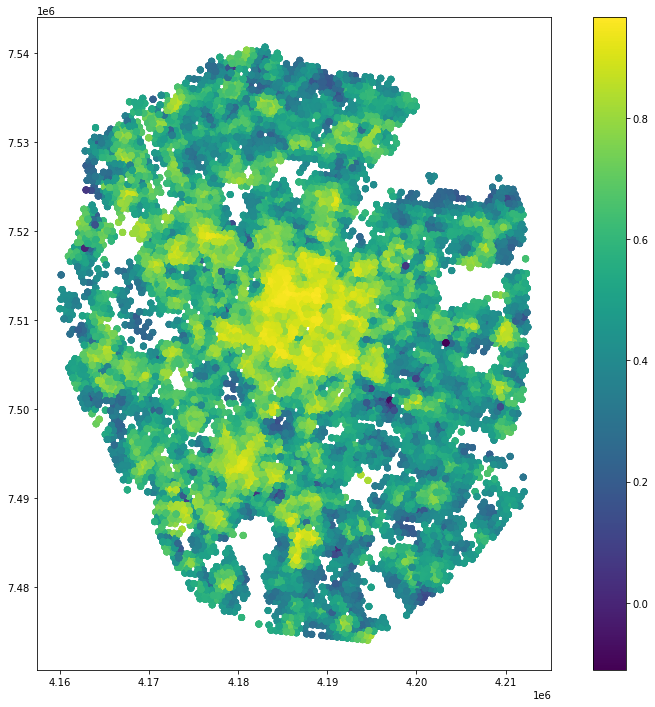

In [280]:
df_model.plot(column='local_r2_rich', figsize=(15,12), legend=True)

In [269]:
df_model['gwr_resid_youth']=gwr_results.resid_response

In [281]:
df_model['gwr_resid_rich']=gwr_rich_results.resid_response

In [31]:
ds_mus=gpd.sjoin(df_mus.to_crs('epsg:3857'),df_spring.set_geometry('buffer_1km'), op='intersects' )

ds_mus['name'].unique()

ValueError: Cannot transform naive geometries.  Please set a crs on the object first.

In [82]:
ds_mus.shape

(2679, 58)

In [303]:
gwr_rich_results.params.shape

(35010, 13)

In [ ]:
# С остатками все ок теперь. Подумать как проверить GWR на гомоскедостичность

<AxesSubplot:>

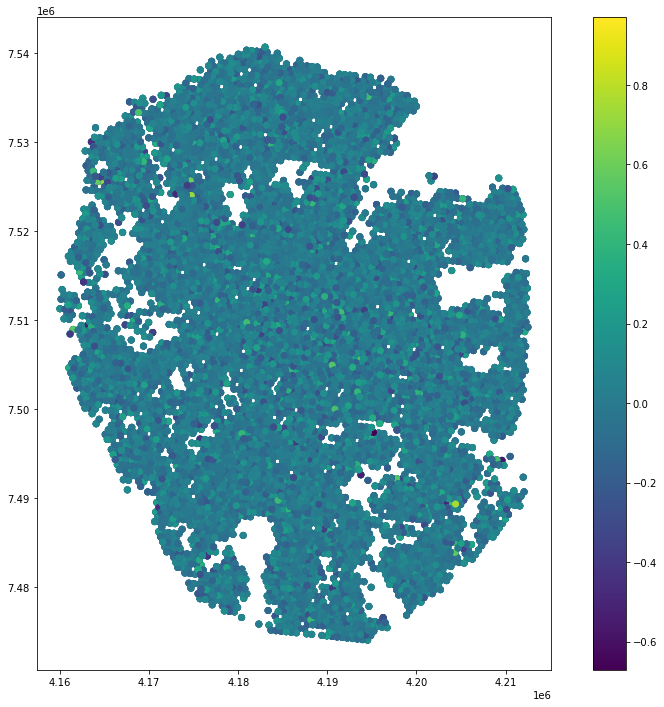

In [429]:
df_model.plot(column='gwr_resid_youth', figsize=(15,12), legend=True)

<AxesSubplot:>

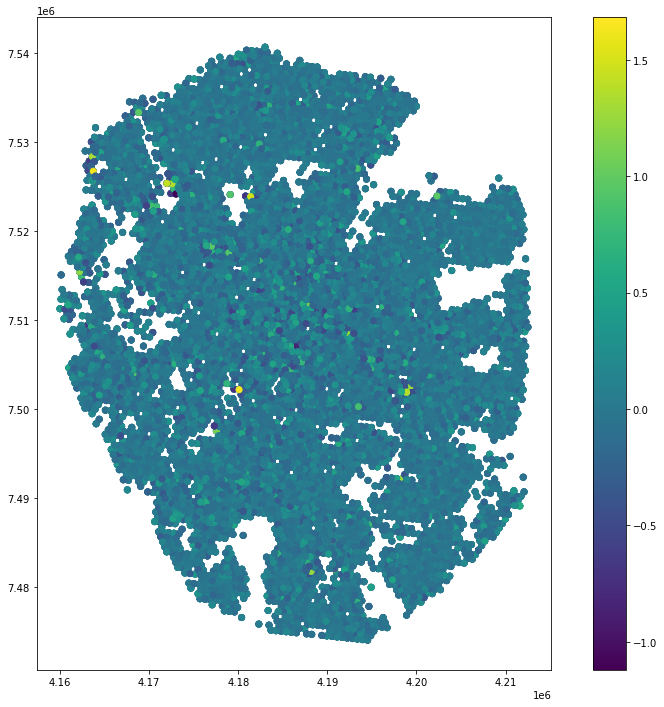

In [428]:
df_model.plot(column='gwr_resid_rich', figsize=(15,12), legend=True)

In [316]:
gwr_rich_results.y

array([0.67069656, 0.54368893, 0.62438675, ..., 1.51034191, 1.58806538,
       2.2649898 ])

In [317]:
y

array([[0.71873154],
       [0.70030802],
       [0.72386389],
       ...,
       [0.71897673],
       [0.69193923],
       [0.89146175]])

In [ ]:
for y_col in ['Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow','Non-residents/moscow_log']:
    for l in df_model['fin_ws_level'].unique():
        for v in [0,1]:
            ss_res=sum(df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)]['resid_'+y_col].apply(lambda x: x*x))
            print(ss_res)
            y_mean=df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)][y_col].mean()
            ss_tot=sum(df_model[(df_model['fin_ws_level']==l)&(df_model['is_living']==v)][y_col].apply(lambda y: (y-y_mean)*(y-y_mean)))
            print(ss_tot)
            try:
                r2=1-ss_res/ss_tot
                print(y_col,l,v,r2)
            except:
                print('no solution')

In [ ]:
df_model.head

In [446]:
df_spring['mus_350']

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
6997    0.0
6998    0.0
6999    0.0
7000    0.0
7001    0.0
Name: mus_350, Length: 7002, dtype: float64

In [2]:
df_mus=gpd.read_file(r'C:\Users\Intra24\Desktop\travel_museum_startup\список_музеев.csv')

In [ ]:
for i in ['t_v_mus_350_rich', 't_v_mus_1000_rich','t_v_mus_350_youth', 't_v_mus_1000_youth']:
    df_spring

In [8]:
df_mus.geometry=[ Point (float(i),float(j)) for i,j in zip(df_mus['long'], df_mus['lat'])]

In [447]:
df_spring

,index,HEX GID,season,Active youth interest 2.4/moscow,Rich men interest 2.4/moscow,Non-residents/moscow_log,intersect,fin_ws,mus_350,mus_1000,...,t_v_is_living_youth,t_v_constant_rich,t_v_intersect_rich,t_v_fin_ws_rich,t_v_mus_350_rich,t_v_mus_1000_rich,t_v_rail_350_rich,t_v_metro_350_rich,t_v_bus_350_rich,t_v_is_living_rich
0,1,891181b41a3ffff,1,0.700308,0.543689,0.000000,96.0,40.562197,0.0,0.0,...,-3.297597,-8.851243,0.000000,0.000000,0.0,-2.567426,0.000000,0.00000,0.0,0.000000
1,6,891181b41a7ffff,1,0.656099,0.550427,0.001350,177.0,59.113286,0.0,0.0,...,0.000000,-3.431251,0.000000,0.000000,0.0,0.000000,0.000000,0.00000,0.0,-3.928251
2,11,891181b41b7ffff,1,0.541550,0.419602,0.000593,187.0,59.113286,0.0,0.0,...,6.030792,-10.159480,0.000000,0.000000,0.0,-2.086463,0.000000,0.00000,0.0,6.840524
3,16,891181b41bbffff,1,0.738564,0.600527,0.000000,62.0,40.562197,0.0,0.0,...,-1.991017,0.000000,0.000000,0.000000,0.0,-2.693527,0.000000,0.00000,0.0,-2.818924
4,21,891181b4427ffff,1,0.743743,0.696368,0.000820,119.0,40.562197,0.0,0.0,...,-4.921155,-5.664999,-3.485760,-6.127223,0.0,0.000000,2.189504,7.90479,0.0,-5.820262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6997,34986,8911aa7b6cbffff,1,0.849535,1.408618,0.010004,380.0,69.205131,0.0,0.0,...,0.000000,2.739443,5.006803,0.000000,0.0,-2.390206,0.000000,0.00000,0.0,0.000000
6998,34991,8911aa7b6cfffff,1,0.844054,0.882783,0.002147,255.0,69.205131,0.0,1.0,...,0.000000,3.011815,5.572897,0.000000,0.0,-2.049613,0.000000,0.00000,0.0,0.000000
6999,34996,8911aa7b6d3ffff,1,0.853670,1.218951,0.005833,468.0,69.205131,0.0,0.0,...,0.000000,0.000000,4.441936,2.278180,0.0,-2.285167,0.000000,0.00000,0.0,0.000000
7000,35001,8911aa7b6d7ffff,1,0.944038,0.839828,0.008945,289.0,69.205131,0.0,0.0,...,0.000000,0.000000,4.594283,2.532799,0.0,-2.087181,0.000000,0.00000,0.0,0.000000


In [39]:
df_mus=df_mus.set_crs('epsg:4326')

In [40]:
df_mus

,name,long,lat,geometry
0,Мемориальная квартира А. Белого,37.58542057,55.74711899,POINT (37.58542 55.74712)
1,Музей археологии Москвы,37.61719346,55.75631862,POINT (37.61719 55.75632)
2,Музейно - выставочный Центр В.А. Гиляровского,37.61535668,55.76344371,POINT (37.61536 55.76344)
3,Мемориальный музей космонавтики,37.63974704,55.82274808,POINT (37.63975 55.82275)
4,Выставочный зал Музея русского лубка и наивног...,37.7953485,55.79604872,POINT (37.79535 55.79605)
...,...,...,...,...
279,Музей истории индустриализации земледелия Имен...,37.5569867,55.8364541,POINT (37.55699 55.83645)
280,Государственная Третьяковская галерея,37.620364,55.741331,POINT (37.62036 55.74133)
281,ГМИИ им.Пушкина,37.6050861,55.7472861,POINT (37.60509 55.74729)
282,Музей русского импрессионизма,37.570311,55.78032,POINT (37.57031 55.78032)


In [84]:
ds_mus.groupby(['name'])['t_v_mus_1000_rich'].mean()[ds_mus.groupby(['name'])['t_v_mus_1000_rich'].mean()>0]

name
Art Future Gallery                                                     0.224636
Галерея «На Шаболовке»                                                 0.487637
Государственный выставочный зал "Галерея "Беляево"                     0.620895
Государственный музей истории российской литературы имени В.И. Даля    0.219004
Еврейский музей и центр толерантности                                  1.322668
Музей Морского космического флота                                      0.219560
Музей Москвы                                                           0.197104
Музей С.А. Есенина                                                     1.874532
Музей Яндекса                                                          0.617981
Музей денег                                                            0.354409
Музей истории евреев в России                                          0.283255
Музей ратной истории Москвы                                            0.220543
Музей спортивной славы ЦСКА        

In [94]:
neg=ds_mus.groupby(['name'])['t_v_mus_1000_rich'].mean()[ds_mus.groupby(['name'])['t_v_mus_1000_rich'].median()<0]

In [110]:
pos=ds_mus.groupby(['name'])['t_v_mus_1000_rich'].mean()[ds_mus.groupby(['name'])['t_v_mus_1000_rich'].median()>0]

In [92]:
df_mus=df_mus.set_index('name').join(ds_mus.groupby(['name'])['t_v_mus_1000_rich'].mean()[ds_mus.groupby(['name'])['t_v_mus_1000_rich'].median()==0], how='left')

In [93]:
df_mus.rename(columns={'t_v_mus_1000_rich':'rich_no_sign'}, inplace=True)

In [121]:
df_spring['land_use']=df_spring['is_living'].map({0:'commercial',1:'residential'})

Text(0.5, 1.0, 'Land use')

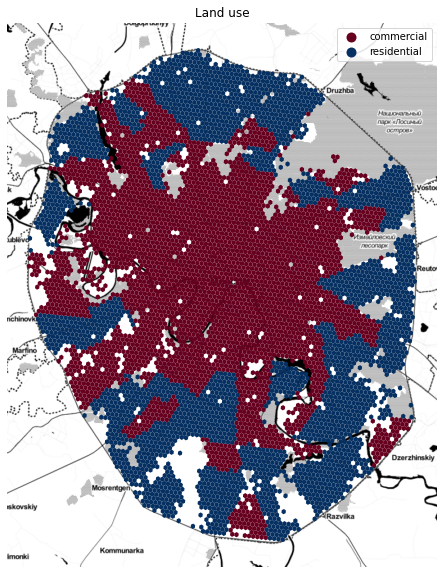

In [135]:
fig,ax=plt.subplots(figsize=(10,10))
df_spring.plot(column='land_use', ax=ax, legend=True, cmap='RdBu')
ctx.add_basemap(ax, url=ST_TONER)
ax.set_axis_off()
plt.title('Land use')

In [7]:
ds_mus[ds_mus['t_v_mus_1000_rich']>0].loc[255]

NameError: name 'ds_mus' is not defined

In [149]:
ds_mus[ds_mus['t_v_mus_1000_rich']>0].loc[255]
#[['name','fin_ws_level','t_v_mus_1000_rich']]

,name,long,lat,geometry,1km_buffer,index_right,index,HEX GID,season,Active youth interest 2.4/moscow,...,t_v_is_living_youth,t_v_constant_rich,t_v_intersect_rich,t_v_fin_ws_rich,t_v_mus_350_rich,t_v_mus_1000_rich,t_v_rail_350_rich,t_v_metro_350_rich,t_v_bus_350_rich,t_v_is_living_rich
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6422,32111,8911aa7a98fffff,1,1.254995,...,-9.205084,5.673748,0.000000,5.475654,0.0,0.000000,0.0,0.000000,-2.350052,4.808743
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6419,32096,8911aa7a983ffff,1,1.195142,...,0.000000,-5.718028,2.816779,4.135237,0.0,0.000000,0.0,0.000000,0.000000,-5.716216
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6432,32161,8911aa7a9bbffff,1,1.316843,...,-15.755107,0.000000,0.000000,6.195074,0.0,2.340312,0.0,2.097880,-2.478350,4.224110
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6420,32101,8911aa7a987ffff,1,1.226331,...,-9.714625,3.096457,0.000000,4.845762,0.0,2.073195,0.0,0.000000,0.000000,4.117490
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6424,32121,8911aa7a997ffff,1,1.145094,...,-22.826680,-4.063976,2.762655,3.010817,0.0,0.000000,0.0,0.000000,0.000000,0.000000
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",6430,32151,8911aa7a9b3ffff,1,1.218188,...,-12.456001,-5.288553,0.000000,5.145035,0.0,2.416800,0.0,2.061155,0.000000,4.595927
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",4137,20686,8911aa71a4bffff,1,1.121306,...,-8.465225,4.583183,0.000000,3.506579,0.0,2.011667,0.0,2.018409,0.000000,4.491518
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",4141,20706,8911aa71a5bffff,1,1.085043,...,-15.764841,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.000000,2.899679
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",4138,20691,8911aa71a4fffff,1,1.019640,...,-21.071342,-4.137560,0.000000,3.908437,0.0,2.171464,0.0,1.993233,0.000000,4.421699
255,Еврейский музей и центр толерантности,37.6081055,55.7892592,POINT (4186515.154 7516577.000),"POLYGON ((4187515.154 7516577.000, 4187510.339...",4135,20676,8911aa71a43ffff,1,1.044564,...,-5.330177,-3.747318,0.000000,2.225113,0.0,2.213238,0.0,0.000000,0.000000,2.019210


In [ ]:
ds_mus[ds_mus['t_v_mus_1000_youth']>0]

In [ ]:
ST_TONER = 'http://tile.stamen.com/toner/tileZ/tileX/tileY.png'
fig,ax=plt.subplots(figsize=(10,12))
df_mus.join(n, how='inner').to_crs('epsg:3857').plot(ax=ax)
ctx.add_basemap(ax, url=ST_TONER)

In [10]:
df_results=pd.read_csv('df_results_11.10_1.csv')

In [2]:
df_spring=pd.read_csv('df_spring.csv')#

In [3]:
df_spring.head()

,Unnamed: 0,index,HEX GID,season,Active youth interest 2.4/moscow,Rich men interest 2.4/moscow,Non-residents/moscow_log,intersect,fin_ws,mus_350,...,t_v_is_living_youth,t_v_constant_rich,t_v_intersect_rich,t_v_fin_ws_rich,t_v_mus_350_rich,t_v_mus_1000_rich,t_v_rail_350_rich,t_v_metro_350_rich,t_v_bus_350_rich,t_v_is_living_rich
0,0,1,891181b41a3ffff,1,0.700308,-0.603875,0.000000,96.0,40.562197,0.0,...,-3.297597,-8.855704,0.000000,0.000000,0.0,-2.570389,0.000000,0.000000,0.0,0.000000
1,1,6,891181b41a7ffff,1,0.656099,-0.591626,0.001350,177.0,59.113286,0.0,...,0.000000,-3.431718,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,-3.932012
2,2,11,891181b41b7ffff,1,0.541550,-0.861325,0.000593,187.0,59.113286,0.0,...,6.030792,-10.161737,0.000000,0.000000,0.0,-2.089120,0.000000,0.000000,0.0,6.841599
3,3,16,891181b41bbffff,1,0.738564,-0.504965,0.000000,62.0,40.562197,0.0,...,-1.991017,0.000000,0.000000,0.000000,0.0,-2.696520,0.000000,0.000000,0.0,-2.820934
4,4,21,891181b4427ffff,1,0.743743,-0.357578,0.000820,119.0,40.562197,0.0,...,-4.921155,-5.676933,-3.497453,-6.138839,0.0,0.000000,2.194721,7.916706,0.0,-5.832822


In [4]:
df_spring['geometry_hex']=df_spring['geometry_hex'].apply(lambda x: shapely.wkt.loads(x))

In [5]:
df_spring=gpd.GeoDataFrame(df_spring, geometry='geometry_hex', crs='epsg:3857')

In [6]:
df_spring.columns

Index(['Unnamed: 0', 'index', 'HEX GID', 'season',
       'Active youth interest 2.4/moscow', 'Rich men interest 2.4/moscow',
       'Non-residents/moscow_log', 'intersect', 'fin_ws', 'mus_350',
       'mus_1000', 'rail_350', 'metro_350', 'bus_350', 'season__1',
       'season__2', 'season__3', 'season__co', 'is_living', 'Non-resi_1',
       'y_fitted_Active youth interest 2.4/moscow',
       'resid_Active youth interest 2.4/moscow',
       'y_fitted_Rich men interest 2.4/moscow',
       'resid_Rich men interest 2.4/moscow',
       'y_fitted_Non-residents/moscow_log', 'resid_Non-residents/moscow_log',
       'local_r2', 'local_r2_y', 'gwr_resid_youth', 'local_r2_rich',
       'gwr_resid_rich', 'fin_ws_level', 'geometry_hex', 'local_r2_youth',
       'hex_buffer', 't_v_constant_youth', 't_v_intersect_youth',
       't_v_fin_ws_youth', 't_v_mus_350_youth', 't_v_mus_1000_youth',
       't_v_rail_350_youth', 't_v_metro_350_youth', 't_v_bus_350_youth',
       't_v_is_living_youth', 't_v_con

In [89]:
df_spring[['resid_Non-residents/moscow_log','Non-residents/moscow_log', 'y_fitted_Non-residents/moscow_log']]

,resid_Non-residents/moscow_log,Non-residents/moscow_log,y_fitted_Non-residents/moscow_log
0,-3.543912,0.000000,-7.969013
1,1.014936,0.001350,-7.622248
2,0.188938,0.000593,-7.619972
3,-3.028618,0.000000,-8.484307
4,1.365651,0.000820,-8.471337
...,...,...,...
6997,0.758669,0.010004,-5.363479
6998,1.474468,0.002147,-7.618060
6999,0.706838,0.005833,-5.851012
7000,2.190213,0.008945,-6.906858


In [7]:
df_mus=gpd.read_file(r'C:\Users\Intra24\Desktop\travel_museum_startup\список_музеев.csv')
df_mus['geometry']=[ Point (float(i),float(j)) for i,j in zip(df_mus['long'], df_mus['lat'])]

df_mus=gpd.GeoDataFrame(df_mus, geometry='geometry', crs='epsg:4326')


In [50]:
df_spring['buffer_1km']=df_spring['geometry_hex'].apply(lambda x: x.buffer(1000))

In [51]:
ds_mus=gpd.sjoin(df_mus.to_crs('epsg:3857'),df_spring.set_geometry('buffer_1km'), op='intersects' )

In [58]:
gpd.GeoDataFrame(ds_mus[['t_v_mus_1000_youth','t_v_mus_1000_rich','name','hex_buffer']], geometry='hex_buffer', crs='epsg:4326').to_file('ds_mus.geojson', driver='GeoJSON')

In [ ]:
gpd.GeoDataFrame(ds_mus[['t_v_mus_350_rich','t_v_mus_1000_rich','name','hex_buffer']], geometry='hex_buffer', crs='epsg:4326').to_file('ds_mus.geojson', driver='GeoJSON')

In [15]:
df_spring.geometry

0       POINT (4199233.619 7477379.704)
1       POINT (4199581.459 7477886.725)
2       POINT (4199010.091 7477946.393)
3       POINT (4198885.832 7476872.709)
4       POINT (4194516.359 7474069.108)
                     ...               
6997    POINT (4173589.634 7488160.961)
6998    POINT (4173935.670 7488669.424)
6999    POINT (4172793.256 7488784.498)
7000    POINT (4173139.248 7489293.026)
7001    POINT (4173018.467 7488218.502)
Name: geometry_hex, Length: 7002, dtype: geometry

In [10]:
df_spring_dist=gpd.sjoin( df_dist_ws.to_crs('epsg:3857'), df_spring, op='intersects')

In [11]:
df_spring_dist['r']=df_spring_dist.groupby('en_name')['index_right'].rank('first')

In [85]:
df_dist_resid=df_spring_dist.groupby(['en_name'])['resid_Non-residents/moscow_log','Non-residents/moscow_log','resid_Active youth interest 2.4/moscow'].mean().join(df_spring_dist[df_spring_dist['r']==1].set_index('en_name')[['geometry']])

In [86]:
df_dist_resid=gpd.GeoDataFrame(df_dist_resid, geometry='geometry', crs='epsg:3857')

In [87]:
df_dist_resid=df_dist_resid.to_crs('epsg:4326')

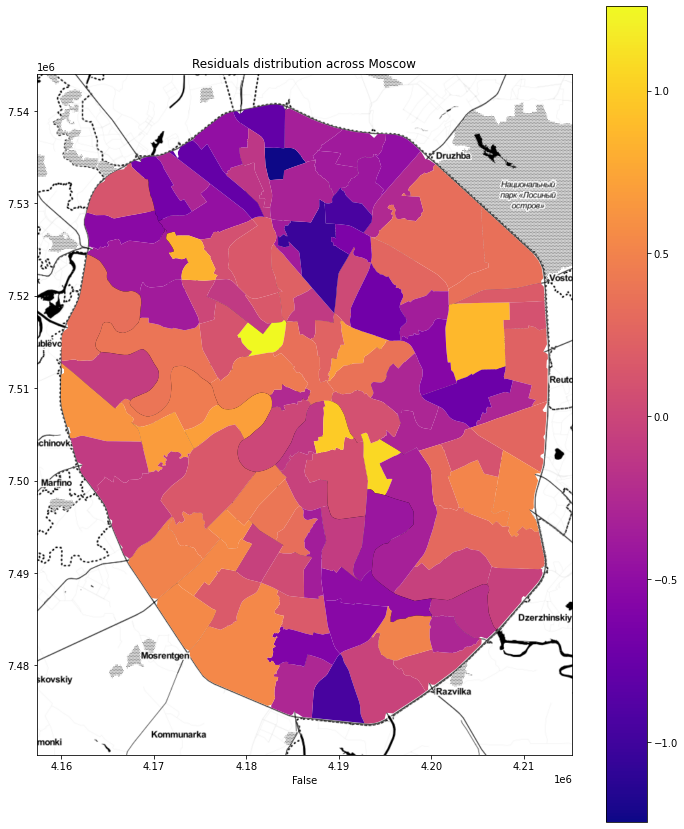

In [27]:

fig, ax=plt.subplots(figsize=(12,15))
ST_TONER = 'http://tile.stamen.com/toner/tileZ/tileX/tileY.png'
hb=df_dist_resid.to_crs('epsg:3857').plot(column='resid_Non-residents/moscow_log', ax=ax, cmap='plasma',  legend=True)
ctx.add_basemap(ax, url=ST_TONER)
plt.title('Residuals distribution across Moscow')
ax.set_xlabel(False)
plt.show()

In [32]:
df_dist_resid.to_file('df_dist_resid.geojson', driver='GeoJSON')

In [ ]:
! pip uninstall cartoframes

In [320]:
from carto.auth import APIKeyAuthClient

USERNAME=  'intra25',
apiKey= '37901b9562261135561eb97e45e51064a64ea4fb'
USR_BASE_URL = "https://{user}.carto.com/".format(user=USERNAME)
auth_client = APIKeyAuthClient(api_key=apiKey, base_url=USR_BASE_URL)

In [355]:
import cartoframes
cc = cartoframes.CartoContext(BASEURL, APIKEY)

AttributeError: module 'cartoframes' has no attribute 'CartoContext'

In [356]:
from cartoframes import Credentials

ImportError: cannot import name 'Credentials' from 'cartoframes' (C:\Users\Intra24\Anaconda3\lib\site-packages\cartoframes\__init__.py)

In [325]:
from cartoframes.auth import set_default_credentials

set_default_credentials('cred.json')

In [88]:
df_dist_resid['er_relative']=

,resid_Non-residents/moscow_log,Non-residents/moscow_log,resid_Active youth interest 2.4/moscow,geometry
en_name,,,,
Aeroport,-0.102544,0.005969,0.046722,"POLYGON ((37.51101 55.80608, 37.51137 55.80647..."
Akademicheskij,0.402914,0.006286,-0.255467,"POLYGON ((37.55226 55.68403, 37.55232 55.68408..."
Alekseevskij,0.034296,0.004672,0.077853,"POLYGON ((37.63499 55.79714, 37.63552 55.79965..."
Altuf'evskij,-1.243408,0.001717,-0.011964,"POLYGON ((37.56740 55.88730, 37.57245 55.88724..."
Arbat,-0.251674,0.025454,-0.134953,"POLYGON ((37.57206 55.75202, 37.57396 55.75256..."
...,...,...,...,...
Vyhino-Zhulebino,0.535577,0.002913,-0.048466,"POLYGON ((37.78726 55.69031, 37.78726 55.69047..."
Zamoskvorech'e,0.985826,0.016366,0.151636,"POLYGON ((37.61513 55.72688, 37.61761 55.72708..."
Zapadnoe Degunino,-0.775329,0.001686,-0.263215,"POLYGON ((37.49751 55.89135, 37.49757 55.89129..."


In [78]:
from cartoframes.viz import Map, Layer, color_continuous_style, palettes, histogram_widget

Map(Layer(df_dist_resid, 
          style=color_continuous_style('resid_Non-residents/moscow_log', palette='Temps'),
          title='residuals',
          widgets=histogram_widget('resid_Non-residents/moscow_log', title='Residuals', description=None, footer=None, read_only=False, buckets=10)
         )
   )


In [178]:
from cartoframes.viz import Map, Layer, color_continuous_style, palettes, histogram_widget
# plot(column='Non-residents/moscow', cmap='OrRd', figsize=(10,15))
Map(Layer(df_model[(df_model.lock=='normal')&(df_model['land_use']=='commercial')].to_crs('epsg:4326').set_geometry('hex_buffer'), 
          style=color_continuous_style('Non-residents/moscow', palette='Temps'),
          title='rNon-residents',
#           widgets=histogram_widget('resid_Non-residents/moscow_log', title='Residuals', description=None, footer=None, read_only=False, buckets=10)
         )
   )


In [ ]:
Map(Layer(df_model[(df_model.lock=='lockdown')&(df_model['land_use']=='commercial')].to_crs('epsg:4326').set_geometry('hex_buffer'), 
          style=color_continuous_style('Non-residents/moscow', palette='Temps'),
          title='rNon-residents',
#           widgets=histogram_widget('resid_Non-residents/moscow_log', title='Residuals', description=None, footer=None, read_only=False, buckets=10)
         )
   )


In [15]:
from keplergl import KeplerGl

In [16]:
map_1 = KeplerGl()
map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl()

In [25]:
df_model['hex_buffer']=df_model['HEX GID'].apply(lambda x: Polygon(h3.h3_to_geo_boundary(x, True)))

In [61]:
data=df_model[df_model.Month=='2020_05'][['geometry','Rich men interest 2.4/moscow']]#, geometry='geometry', crs='epsg:3857' )

In [48]:
data.rename(columns={'hex_buffer':'geometry'}, inplace=True)

In [57]:
data[:3]

,geometry,Rich men interest 2.4/moscow,land_use
13,POINT (4199233.6191262938082218 7477379.703508...,0.442218,residential
29,POINT (4199581.4585764305666089 7477886.725166...,0.589850,residential
45,POINT (4199010.0908164484426379 7477946.392919...,0.720022,residential


In [ ]:
! conda install nodejs

In [70]:
! jupyter labextension install @jupyter-widgets/jupyterlab-manager keplergl-jupyter

An error occured.
ValueError: Please install nodejs 5+ and npm before continuing installation. nodejs may be installed using conda or directly from the nodejs website.
See the log file for details:  C:\Users\Intra24\AppData\Local\Temp\jupyterlab-debug-k56cxu0t.log


In [22]:
df_rent_price=gpd.read_file(r'C:\Users\Intra24\Documents\ГК Родина\map_floor_price.geojson')

In [34]:
df_rent_price['500m_pol']=df_rent_price.to_crs('epsg:3857').geometry.buffer(800)

In [37]:
df_rent_price['500m_pol']

0       POLYGON ((4160809.371 7473286.741, 4160805.519...
1       POLYGON ((4161899.848 7473286.741, 4161895.995...
2       POLYGON ((4162990.324 7473286.741, 4162986.472...
3       POLYGON ((4164080.801 7473286.741, 4164076.949...
4       POLYGON ((4165171.278 7473286.741, 4165167.425...
                              ...                        
2495    POLYGON ((4209880.820 7538534.186, 4209876.968...
2496    POLYGON ((4210971.297 7538534.186, 4210967.444...
2497    POLYGON ((4212061.773 7538534.186, 4212057.921...
2498    POLYGON ((4213152.250 7538534.186, 4213148.398...
2499    POLYGON ((4214242.727 7538534.186, 4214238.874...
Name: 500m_pol, Length: 2500, dtype: geometry

In [59]:
df_join_price=gpd.sjoin(df_lock.to_crs('epsg:4326').set_geometry('hex_buffer').to_crs('epsg:3857'), df_rent_price.set_geometry('500m_pol'), how='inner', op='intersects')

df_join_price[['Rich men interest 2.4','price_calc']].corr()

,Rich men interest 2.4,price_calc
Rich men interest 2.4,1.000000,0.331049
price_calc,0.331049,1.000000


In [65]:
df_join_price_norm=gpd.sjoin(df_normal.to_crs('epsg:4326').set_geometry('hex_buffer').to_crs('epsg:3857'), df_rent_price.set_geometry('500m_pol'), how='inner', op='intersects')

In [66]:
df_join_price_norm[['Rich men interest 2.4','price_calc']].corr()

,Rich men interest 2.4,price_calc
Rich men interest 2.4,1.000000,0.346086
price_calc,0.346086,1.000000


In [67]:
df_join_price_rec=gpd.sjoin(df_recovery.to_crs('epsg:4326').set_geometry('hex_buffer').to_crs('epsg:3857'), df_rent_price.set_geometry('500m_pol'), how='inner', op='intersects')

df_join_price_rec[['Rich men interest 2.4','price_calc']].corr()

,Rich men interest 2.4,price_calc
Rich men interest 2.4,1.00000,0.33118
price_calc,0.33118,1.00000
